# 06_02_get raw_spectrum_using_trace_line

## 필요한 모듈

이 프로젝트를 위해서는 아래의 모듈이 필요하다. 

> numpy, pandas, matplotlib, astropy, version_information

### 모듈 설치

1. 콘솔 창에서 모듈을 설치할 때는 아래와 같은 형식으로 입력하면 된다.

>pip install module_name==version

>conda install module_name==version

2. 주피터 노트북(코랩 포함)에 설치 할 때는 아래의 셀을 실행해서 실행되지 않은 모듈을 설치할 수 있다. (pip 기준) 만약 아나콘다 환경을 사용한다면 7행을 콘다 설치 명령어에 맞게 수정하면 된다.

In [41]:
# Install a pip package in the current Jupyter kernel
import importlib, sys, subprocess
print(f"sys.executable: {sys.executable}")

packages = "numpy, pandas, matplotlib, scipy, astropy, photutils, ccdproc, version_information" # required modules
pkgs = packages.split(", ")
for pkg in pkgs :
    if not importlib.util.find_spec(pkg):
        subprocess.check_call([sys.executable, '-m', 'pip', 'install', pkg, '-q'])
        print(f"**** {pkg} module is now installed.")
    else: 
        print(f"******** {pkg} module is already installed.")
%load_ext version_information
import time
now = time.strftime("%Y-%m-%d %H:%M:%S (%Z = GMT%z)")
print(f"This notebook was generated at {now} ")

vv = %version_information {packages}
for i, pkg in enumerate(vv.packages):
    print(f"{i} {pkg[0]:10s} {pkg[1]:s}")


sys.executable: /home/guitar79/anaconda3/envs/astro_Python_env/bin/python
******** numpy module is already installed.
******** pandas module is already installed.
******** matplotlib module is already installed.
******** scipy module is already installed.
******** astropy module is already installed.
******** photutils module is already installed.
******** ccdproc module is already installed.
******** version_information module is already installed.
The version_information extension is already loaded. To reload it, use:
  %reload_ext version_information
This notebook was generated at 2024-09-24 16:27:56 (KST = GMT+0900) 
0 Python     3.12.4 64bit [GCC 11.2.0]
1 IPython    8.27.0
2 OS         Linux 5.15.0 122 generic x86_64 with glibc2.31
3 numpy      1.26.4
4 pandas     2.2.2
5 matplotlib 3.9.2
6 scipy      1.14.1
7 astropy    6.1.0
8 photutils  1.12.0
9 ccdproc    2.4.2
10 version_information 1.0.4


### 모듈 버전 확인

아래 셀을 실행하면 이 노트북을 실행한 파이썬 및 관련 모듈의 버전을 확인할 수 있다.

### import modules

In [42]:
from glob import glob
from pathlib import Path
import os
import numpy as np
import astropy.units as u

from astropy.io import fits
from astropy.modeling.polynomial import Polynomial1D
from astropy.modeling.models import Gaussian1D, Linear1D
from astropy.modeling.fitting import LinearLSQFitter, LevMarLSQFitter
# astroquery provides an interface to the NIST atomic line database
from astroquery.nist import Nist

import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

import ysfitsutilpy as yfu
#import ysphotutilpy as ypu
#import ysvisutilpy as yvu

import _astro_utilities
import _Python_utilities

## 폴더 찾기

* MASTERDIR : "CAL-BDF"의 문자열을 가진 폴더를 찾는다. Bias, Dark, Flat 이미지가 들어 있고, 메디안 합성한 master file을 저장한다.
* BDFDIR : "SPTR-CAL_"의 문자열을 가진 폴더를 찾는다. 레퍼런스 전등을 찍은 이미지가 들어 있다. 
* DOINGDIRs : 스펙트럼을 촬영한 폴더들이 list로 들어 있다.

In [43]:
#%%
BASEDIR = Path("/mnt/Rdata/OBS_data") 
PROJECDIR = BASEDIR / "04-Spectra"
# PROJECDIR = BASEDIR/ "2024-Spectra"
TODODIR = PROJECDIR / "-_-_-_2024-05_TEC140_ASI183MMPro_-_1bin"
# TODODIR = PROJECDIR / "_-_-_2024-06_-_GSON300_STF-8300M_-_1bin"

DOINGDIRs = sorted(_Python_utilities.getFullnameListOfsubDirs(TODODIR))
# print ("DOINGDIRs: ", format(DOINGDIRs))
# print ("len(DOINGDIRs): ", format(len(DOINGDIRs)))

MASTERDIR = [x for x in DOINGDIRs if "CAL-BDF" in str(x)]
MASTERDIR = Path(MASTERDIR[0]) / _astro_utilities.master_dir
print ("MASTERDIR: ", format(MASTERDIR))

BDFDIR = [x for x in DOINGDIRs if "SPTR-CAL_" in str(x)]
print ("BDFDIR: ", format(BDFDIR))

DOINGDIRs = sorted([x for x in DOINGDIRs if "_LIGHT_" in str(x)])
DOINGDIRs = sorted([x for x in DOINGDIRs if not "SPTR-CAL_" in str(x)])
print ("DOINGDIRs: ", format(DOINGDIRs))
print ("len(DOINGDIRs): ", format(len(DOINGDIRs)))

filter_str = 'VEGA_LIGHT_-_2024-05-01'
DOINGDIRs = [x for x in DOINGDIRs if filter_str in x]
# remove = 'BIAS'
# DOINGDIRs = [x for x in DOINGDIRs if remove not in x]
# remove = 'DARK'
# DOINGDIRs = [x for x in DOINGDIRs if remove not in x]
# remove = 'FLAT'
# DOINGDIRs = [x for x in DOINGDIRs if remove not in x]
print ("DOINGDIRs: ", DOINGDIRs)
print ("len(DOINGDIRs): ", len(DOINGDIRs))
#######################################################

MASTERDIR:  /mnt/Rdata/OBS_data/04-Spectra/-_-_-_2024-05_TEC140_ASI183MMPro_-_1bin/-_CAL-BDF_-_2024-05-14_-_TEC140_ASI183MMPro_-_1bin/master_files_ys
BDFDIR:  ['/mnt/Rdata/OBS_data/04-Spectra/-_-_-_2024-05_TEC140_ASI183MMPro_-_1bin/SPTR-CAL_LIGHT_-_2024-05-14_-_TEC140_ASI183MMPro_-_1bin/']
DOINGDIRs:  ['/mnt/Rdata/OBS_data/04-Spectra/-_-_-_2024-05_TEC140_ASI183MMPro_-_1bin/SPTR-HIP24608-CAPELA_LIGHT_-_2024-04-26_-_TEC140_ASI183MMPro_-_1bin/', '/mnt/Rdata/OBS_data/04-Spectra/-_-_-_2024-05_TEC140_ASI183MMPro_-_1bin/SPTR-HIP27989-BETELGEUSE_LIGHT_-_2024-05-01_-_TEC140_ASI183MMPro_-_1bin/', '/mnt/Rdata/OBS_data/04-Spectra/-_-_-_2024-05_TEC140_ASI183MMPro_-_1bin/SPTR-HIP31681-ALHENA_LIGHT_-_2024-05-01_-_TEC140_ASI183MMPro_-_1bin/', '/mnt/Rdata/OBS_data/04-Spectra/-_-_-_2024-05_TEC140_ASI183MMPro_-_1bin/SPTR-HIP32246-MEBSUTA_LIGHT_-_2024-05-01_-_TEC140_ASI183MMPro_-_1bin/', '/mnt/Rdata/OBS_data/04-Spectra/-_-_-_2024-05_TEC140_ASI183MMPro_-_1bin/SPTR-HIP32349-SIRIUS_LIGHT_-_2024-04-26_-_TEC14

# Set varibales

In [44]:
#######################################################
ylow, yhigh = 1775, 1910 
wei_ylow, wei_yhigh = 1800, 1880
xhigh = 4200

# start by taking +/- 15 pixels
npixels_to_cut = 15
npixels = 20

guessed_wavelengths = [667.728, 640.2, 585.2]  # Ar, Ne, Ne
guessed_xvals = [600, 970, 1550]

# guessed_wavelengths = [763.511, 750.387, 727.294, 706.722, 696.543,
#                        667.728, 640.225, 614.306, 585.249, 
#                        476.487, 451.073, 420.067, 394.898
#                        ]  
guessed_wavelengths = [763.511, 750.387, 727.294, 
                       706.722, 696.543,
                       614.306, 585.249,
                       420.067, 394.989]
guessed_xvals = [1018, 1127, 1318, 
                 1482, 1560,
                 2200, 2420,
                 3770, 3965]

HBalmer = [656.279,	486.135, 434.0472, 410.1734, 397.0075] * u.nm

calfile_idx = 0
#######################################################

## Cal file Summary

In [45]:
BDFDIR = Path(BDFDIR[0])
print("BDFDIR", BDFDIR)

summary_cal = yfu.make_summary(BDFDIR / "*.fit*")
if summary_cal is not None : 
    #print(summary)
    print("len(summary_cal):", len(summary_cal))
    print("summary_cal:", summary_cal)
    #print(summary_cal["file"][0])

fpath_cal = Path(summary_cal["file"][calfile_idx])
fpath_cal = Path(summary_cal["file"][len(summary_cal["file"])-3])

BDFDIR /mnt/Rdata/OBS_data/04-Spectra/-_-_-_2024-05_TEC140_ASI183MMPro_-_1bin/SPTR-CAL_LIGHT_-_2024-05-14_-_TEC140_ASI183MMPro_-_1bin
All 49 keywords (guessed from /mnt/Rdata/OBS_data/04-Spectra/-_-_-_2024-05_TEC140_ASI183MMPro_-_1bin/SPTR-CAL_LIGHT_-_2024-05-14_-_TEC140_ASI183MMPro_-_1bin/SPTR-CAL_LIGHT__2024-05-14-06-15-05_2sec_TEC140_ASI183MMPro_-9c_1bin.fit) will be loaded.


/home/guitar79/Downloads/ysfitsutilpy/ysfitsutilpy/filemgmt.py:347: UserWarning: Key RA not found for /mnt/Rdata/OBS_data/04-Spectra/-_-_-_2024-05_TEC140_ASI183MMPro_-_1bin/SPTR-CAL_LIGHT_-_2024-05-14_-_TEC140_ASI183MMPro_-_1bin/SPTR-Cal_LIGHT__2024-06-04-07-14-06_10sec_TEC140_ASI183MMPro_6c_1bin.fit, filling with None.
  warn(str_keyerror_fill.format(k, str(item)))
/home/guitar79/Downloads/ysfitsutilpy/ysfitsutilpy/filemgmt.py:347: UserWarning: Key DEC not found for /mnt/Rdata/OBS_data/04-Spectra/-_-_-_2024-05_TEC140_ASI183MMPro_-_1bin/SPTR-CAL_LIGHT_-_2024-05-14_-_TEC140_ASI183MMPro_-_1bin/SPTR-Cal_LIGHT__2024-06-04-07-14-06_10sec_TEC140_ASI183MMPro_6c_1bin.fit, filling with None.
  warn(str_keyerror_fill.format(k, str(item)))
/home/guitar79/Downloads/ysfitsutilpy/ysfitsutilpy/filemgmt.py:347: UserWarning: Key CENTALT not found for /mnt/Rdata/OBS_data/04-Spectra/-_-_-_2024-05_TEC140_ASI183MMPro_-_1bin/SPTR-CAL_LIGHT_-_2024-05-14_-_TEC140_ASI183MMPro_-_1bin/SPTR-Cal_LIGHT__2024-06-04-

len(summary_cal): 75
summary_cal:                                                  file  filesize  SIMPLE  \
0   /mnt/Rdata/OBS_data/04-Spectra/-_-_-_2024-05_T...  40368960    True   
1   /mnt/Rdata/OBS_data/04-Spectra/-_-_-_2024-05_T...  40368960    True   
2   /mnt/Rdata/OBS_data/04-Spectra/-_-_-_2024-05_T...  40368960    True   
3   /mnt/Rdata/OBS_data/04-Spectra/-_-_-_2024-05_T...  40368960    True   
4   /mnt/Rdata/OBS_data/04-Spectra/-_-_-_2024-05_T...  40368960    True   
..                                                ...       ...     ...   
70  /mnt/Rdata/OBS_data/04-Spectra/-_-_-_2024-05_T...  40368960    True   
71  /mnt/Rdata/OBS_data/04-Spectra/-_-_-_2024-05_T...  40368960    True   
72  /mnt/Rdata/OBS_data/04-Spectra/-_-_-_2024-05_T...  40368960    True   
73  /mnt/Rdata/OBS_data/04-Spectra/-_-_-_2024-05_T...  40368960    True   
74  /mnt/Rdata/OBS_data/04-Spectra/-_-_-_2024-05_T...  40368960    True   

    BITPIX  NAXIS  NAXIS1  NAXIS2  EXTEND  BZERO IMAGETYP  ...   

/home/guitar79/Downloads/ysfitsutilpy/ysfitsutilpy/filemgmt.py:347: UserWarning: Key RA not found for /mnt/Rdata/OBS_data/04-Spectra/-_-_-_2024-05_TEC140_ASI183MMPro_-_1bin/SPTR-CAL_LIGHT_-_2024-05-14_-_TEC140_ASI183MMPro_-_1bin/SPTR-Cal_LIGHT__2024-06-04-07-22-18_30sec_TEC140_ASI183MMPro_-10c_1bin.fit, filling with None.
  warn(str_keyerror_fill.format(k, str(item)))
/home/guitar79/Downloads/ysfitsutilpy/ysfitsutilpy/filemgmt.py:347: UserWarning: Key DEC not found for /mnt/Rdata/OBS_data/04-Spectra/-_-_-_2024-05_TEC140_ASI183MMPro_-_1bin/SPTR-CAL_LIGHT_-_2024-05-14_-_TEC140_ASI183MMPro_-_1bin/SPTR-Cal_LIGHT__2024-06-04-07-22-18_30sec_TEC140_ASI183MMPro_-10c_1bin.fit, filling with None.
  warn(str_keyerror_fill.format(k, str(item)))
/home/guitar79/Downloads/ysfitsutilpy/ysfitsutilpy/filemgmt.py:347: UserWarning: Key CENTALT not found for /mnt/Rdata/OBS_data/04-Spectra/-_-_-_2024-05_TEC140_ASI183MMPro_-_1bin/SPTR-CAL_LIGHT_-_2024-05-14_-_TEC140_ASI183MMPro_-_1bin/SPTR-Cal_LIGHT__2024-06

## light Summary

In [46]:
for DOINGDIR in DOINGDIRs[:1] :
    DOINGDIR = Path(DOINGDIR)
    print("DOINGDIR", DOINGDIR)

    READINGDIR = DOINGDIR / "reduced"
    TRACERESULTDIR = DOINGDIR / f"{READINGDIR.parts[-1]}_trace"
    if not TRACERESULTDIR.exists() :
        os.mkdir(str(TRACERESULTDIR))
        print(f"{str(TRACERESULTDIR)} is created...")

    summary = yfu.make_summary(READINGDIR / "*.fit*")
    if summary is not None : 
        #print(summary)
        print("len(summary):", len(summary))
        print("summary:", summary)
        #print(summary["file"][0])

DOINGDIR /mnt/Rdata/OBS_data/04-Spectra/-_-_-_2024-05_TEC140_ASI183MMPro_-_1bin/SPTR-HIP91262-VEGA_LIGHT_-_2024-05-01_-_TEC140_ASI183MMPro_-_1bin
All 51 keywords (guessed from /mnt/Rdata/OBS_data/04-Spectra/-_-_-_2024-05_TEC140_ASI183MMPro_-_1bin/SPTR-HIP91262-VEGA_LIGHT_-_2024-05-01_-_TEC140_ASI183MMPro_-_1bin/reduced/SPTR-HIP91262-VEGA_LIGHT__2024-05-01-16-11-34_5sec_TEC140_ASI183MMPro_-20c_1bin.fit) will be loaded.
len(summary): 23
summary:                                                  file  filesize  SIMPLE  \
0   /mnt/Rdata/OBS_data/04-Spectra/-_-_-_2024-05_T...  80732160    True   
1   /mnt/Rdata/OBS_data/04-Spectra/-_-_-_2024-05_T...  80732160    True   
2   /mnt/Rdata/OBS_data/04-Spectra/-_-_-_2024-05_T...  80732160    True   
3   /mnt/Rdata/OBS_data/04-Spectra/-_-_-_2024-05_T...  80732160    True   
4   /mnt/Rdata/OBS_data/04-Spectra/-_-_-_2024-05_T...  80732160    True   
5   /mnt/Rdata/OBS_data/04-Spectra/-_-_-_2024-05_T...  80732160    True   
6   /mnt/Rdata/OBS_data/04-

### 분광 자료 display



********************
Starting SPTR-HIP91262-VEGA_LIGHT__2024-05-01-16-11-34_5sec_TEC140_ASI183MMPro_-20c_1bin.fit


 [astropy.modeling.fitting]


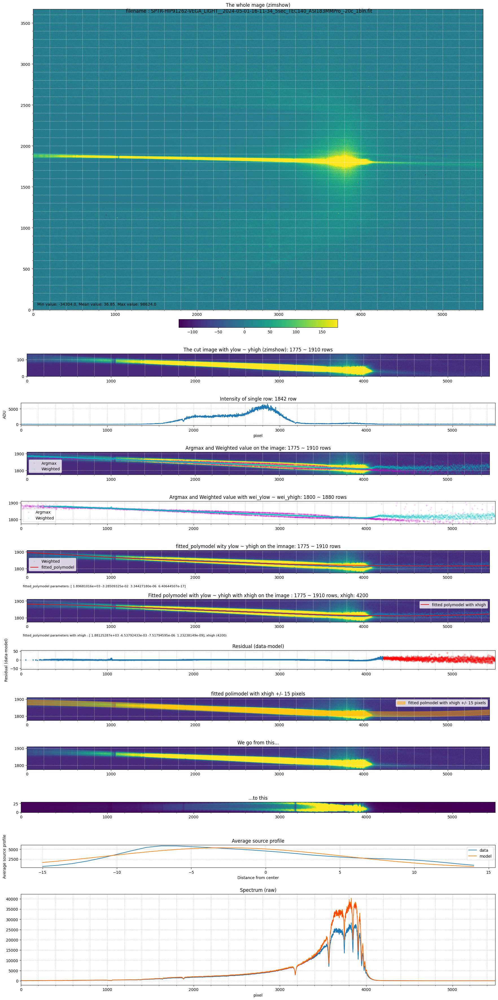

In [47]:
######################################################################################################
fpath = Path(summary["file"][0])
hdul = fits.open(fpath)
print("*"*20)
print(f"Starting {fpath.name}")

##############################################################################
##############################################################################
##############################################
# ylow, yhigh = 1775, 1910 
##############################################
result = f"ylow:{ylow}\nyhigh:{yhigh}\n" 
result += f"wei_ylow:{wei_ylow}\nwei_yhigh:{wei_yhigh}\n"
result += f"xhigh:{xhigh}\n"
result += f"npixels_to_cut:{npixels_to_cut}\n"
result += f"npixels:{npixels}\n"
result += f"calibration file:{fpath_cal}\n"
result += f"guessed_wavelengths:{guessed_wavelengths}\n"
result += f"guessed_xvals:{guessed_xvals}\n"

yvals = np.argmax(hdul[0].data, axis=0)
xvals = np.arange(hdul[0].data.shape[1])
bad_pixels = (yvals < ylow) | (yvals > yhigh)

fig, axs = plt.subplots(13, 1, figsize=(18, 36), 
                        sharex=False, sharey=False, 
                        gridspec_kw={'height_ratios': [14, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 4]})

im0 = _astro_utilities.zimshow(axs[0], 
                    hdul[0].data,
                    origin="lower",
                    cmap = "viridis"
                    )
axs[0].xaxis.set_major_locator(ticker.AutoLocator())
axs[0].xaxis.set_minor_locator(ticker.AutoMinorLocator())
axs[0].yaxis.set_major_locator(ticker.AutoLocator())
axs[0].yaxis.set_minor_locator(ticker.AutoMinorLocator())
axs[0].set_title('The whole mage (zimshow)')
axs[0].annotate(f"Min value: {hdul[0].data.min()}, Mean value: {hdul[0].data.mean():.02f}, Max value: {hdul[0].data.max()}", 
            xy=(15, 15), xycoords='axes pixels')
axs[0].grid(color='white', which='both', axis='both', ls='dotted')

##############################################################################
##############################################################################
im1 = _astro_utilities.zimshow(axs[1], 
                                hdul[0].data[ylow:yhigh, :],
                                origin="lower",
                                cmap = "viridis",
                                )
axs[1].set_title(f'The cut image with ylow ~ yhigh (zimshow): {ylow} ~ {yhigh} rows')
axs[1].xaxis.set_major_locator(ticker.AutoLocator())
axs[1].xaxis.set_minor_locator(ticker.AutoMinorLocator())
axs[1].grid(color='white', which='both', axis='both', ls='dotted')

##############################################################################
##############################################################################
im2 = axs[2].plot(hdul[0].data[int((ylow+yhigh)/2),:])
axs[2].set_xlabel('pixel')
axs[2].set_ylabel('ADU')
axs[2].set_xlim((0,hdul[0].data.shape[1]))
axs[2].set_title(f'Intensity of single row: {int((ylow+yhigh)/2)} row')
axs[2].xaxis.set_major_locator(ticker.AutoLocator())
axs[2].xaxis.set_minor_locator(ticker.AutoMinorLocator())
axs[2].grid(which='both', axis='both', ls='dotted')

##############################################################################
##############################################################################
# we use a cutout around the traced line, so the Y-values are from that cutout
# the `repeat` command here is used to extend our Y-axis position values, which are 425, 426, ... 475
# along the X-direction.  The indexing with [:, None] adds a "dummy" axis along the second (x) dimension,
# then `repeat` copies our Y-axis values.  The resulting array has the same shape as our weight array,
# which is hdul[0].data[425:475, :] minus the median
yaxis = np.repeat(np.arange(ylow, yhigh)[:,None],
                hdul[0].data.shape[1], axis=1)
background = np.median(hdul[0].data)
# moment 1 is the data-weighted average of the Y-axis coordinates
weighted_yaxis_values = np.average(yaxis, axis=0,
                                weights=hdul[0].data[ylow:yhigh,:] - background)
# print("weighted_yaxis_values ", weighted_yaxis_values)
# print("weighted_yaxis_values.shape :", weighted_yaxis_values.shape)

##############################################################################
##############################################################################
##############################################
# wei_ylow, wei_yhigh = 1800, 1880
##############################################

# we need to use the 'extent' keyword to have the axes correctly labeled
im3 = _astro_utilities.zimshow(axs[3], hdul[0].data[ylow:yhigh,:],
        extent=[0,hdul[0].data.shape[1],ylow,yhigh],
        origin="lower",
        cmap="viridis")
# plt.gca().set_aspect(10) # we stretch the image out by 10x in the y-direction
axs[3].plot(xvals[~bad_pixels], yvals[~bad_pixels], 'm+', label="Argmax", markersize=4, alpha=0.2)
axs[3].plot(xvals, weighted_yaxis_values, 'cx', label="Weighted", markersize=3, alpha=0.2)
axs[3].set_xlim((0,hdul[0].data.shape[1]))
axs[3].set_ylim((ylow,yhigh))
axs[3].set_title(f'Argmax and Weighted value on the image: {ylow} ~ {yhigh} rows')
axs[3].legend(loc='best');
axs[3].xaxis.set_major_locator(ticker.AutoLocator())
axs[3].xaxis.set_minor_locator(ticker.AutoMinorLocator())
axs[3].grid(color='white', which='both', axis='both', ls='dotted')

##############################################################################
##############################################################################
bad_moments = (weighted_yaxis_values > wei_yhigh) | (weighted_yaxis_values < wei_ylow)

im4 = axs[4].plot(xvals[~bad_pixels], yvals[~bad_pixels], 'm+', label="Argmax", markersize=4, alpha=0.2)
axs[4].plot(xvals[~bad_moments], weighted_yaxis_values[~bad_moments], 'cx', label="Weighted", markersize=3, alpha=0.2)
axs[4].set_xlim((0,hdul[0].data.shape[1]))
axs[4].set_ylim((ylow,yhigh))
axs[4].set_title(f'Argmax and Weighted value with wei_ylow ~ wei_yhigh: {wei_ylow} ~ {wei_yhigh} rows')
axs[4].legend(loc='best')
axs[4].xaxis.set_major_locator(ticker.AutoLocator())
axs[4].xaxis.set_minor_locator(ticker.AutoMinorLocator())
axs[4].grid(which='both', axis='both', ls='dotted')

##############################################################################
##############################################################################
polymodel = Polynomial1D(degree=3)
linfitter = LinearLSQFitter()

fitted_polymodel = linfitter(polymodel, xvals[~bad_moments], weighted_yaxis_values[~bad_moments])
fitted_polymodel

im5 = _astro_utilities.zimshow(axs[5], hdul[0].data[ylow:yhigh,:], 
        extent=[0,hdul[0].data.shape[1],ylow,yhigh],
        origin="lower",
        cmap="viridis")
axs[5].plot(xvals[~bad_moments], weighted_yaxis_values[~bad_moments], 'x', label="Weighted", markersize=3, alpha=0.2)
axs[5].plot(xvals, fitted_polymodel(xvals), color='r', label="fitted_polymodel");
axs[5].set_title(f'fitted_polymodel wity ylow ~ yhigh on the imnage: {ylow} ~ {yhigh} rows')
axs[5].annotate(f'fitted_polymodel parameters: {fitted_polymodel.parameters}', fontsize=8,
                        xy=(0, 0), xytext=(-10, -30), va='top', ha='left',
                        xycoords='axes fraction', textcoords='offset points')
axs[5].legend(loc='best')
axs[5].xaxis.set_major_locator(ticker.AutoLocator())
axs[5].xaxis.set_minor_locator(ticker.AutoMinorLocator())
axs[5].grid(color='white', which='both', axis='both', ls='dotted')

##############################################################################
##############################################################################
#######################################
# xhigh = 4200
#######################################

fitted_polymodel = linfitter(polymodel, xvals[(~bad_moments) & (xvals < xhigh)],
                                weighted_yaxis_values[(~bad_moments) & (xvals < xhigh)])
fitted_polymodel

im6 = _astro_utilities.zimshow(axs[6], hdul[0].data[ylow:yhigh,:], extent=[0,hdul[0].data.shape[1],ylow,yhigh],
                origin="lower",
                cmap="viridis")
axs[6].plot(xvals[~bad_moments], weighted_yaxis_values[~bad_moments], 'x', markersize=3, alpha=0.25)
axs[6].plot(xvals, fitted_polymodel(xvals), color='r', label="fitted polymodel with xhigh");
axs[6].set_title(f'Fitted polymodel with ylow ~ yhigh with xhigh on the image : {ylow} ~ {yhigh} rows, xhigh: {xhigh}')
axs[6].axis((0,hdul[0].data.shape[1],ylow,yhigh));
axs[6].annotate(f'fitted_polymodel parameters with xhigh : {fitted_polymodel.parameters}, xhigh ({xhigh})', fontsize=8,
                        xy=(0, 0), xytext=(-10, -30), va='top', ha='left',
                        xycoords='axes fraction', textcoords='offset points')
axs[6].legend(loc='best')
axs[6].xaxis.set_major_locator(ticker.AutoLocator())
axs[6].xaxis.set_minor_locator(ticker.AutoMinorLocator())
axs[6].grid(color='white', which='both', axis='both', ls='dotted')

##############################################################################
##############################################################################
im7 = axs[7].plot(xvals[~bad_moments & (xvals < xhigh)],
        weighted_yaxis_values[~bad_moments & (xvals < xhigh)] - fitted_polymodel(xvals[~bad_moments & (xvals < xhigh)]), 'x', markersize=3 )
axs[7].plot(xvals[~bad_moments & (xvals > xhigh)],
        weighted_yaxis_values[~bad_moments & (xvals > xhigh)] - fitted_polymodel(xvals[~bad_moments & (xvals > xhigh)]), 'r+', alpha=0.5)
axs[7].set_ylim(-55, 55)
axs[7].set_xlim((0,hdul[0].data.shape[1]))
axs[7].set_ylabel("Residual (data-model)");
axs[7].set_title(f'Residual (data-model)')
# axs[7].legend(loc='best')
axs[7].xaxis.set_major_locator(ticker.AutoLocator())
axs[7].xaxis.set_minor_locator(ticker.AutoMinorLocator())
axs[7].grid(which='both', axis='both', ls='dotted')

##############################################################################
##############################################################################
# we need to use the 'extent' keyword to have the axes correctly labeled
#######################################
# start by taking +/- 15 pixels
# npixels_to_cut = 15
#######################################
im8 = _astro_utilities.zimshow(axs[8], hdul[0].data[ylow:yhigh,:], extent=[0,hdul[0].data.shape[1],ylow,yhigh],
        origin="lower")
axs[8].fill_between(xvals, fitted_polymodel(xvals)-npixels_to_cut,
                fitted_polymodel(xvals)+npixels_to_cut,
                color='orange', alpha=0.5, 
                label=f'fitted polmodel with xhigh +/- {npixels_to_cut} pixels')
axs[8].set_title(f'fitted polimodel with xhigh +/- {npixels_to_cut} pixels')
axs[8].set_xlim((0,hdul[0].data.shape[1]));
axs[8].set_ylim((ylow,yhigh));
axs[8].legend(loc='best')
axs[8].xaxis.set_major_locator(ticker.AutoLocator())
axs[8].xaxis.set_minor_locator(ticker.AutoMinorLocator())
axs[8].grid(color='white', which='both', axis='both', ls='dotted')

##############################################################################
##############################################################################
trace_center = fitted_polymodel(xvals)
cutouts = np.array([hdul[0].data[int(yval)-npixels_to_cut:int(yval)+npixels_to_cut, ii]
                        for yval, ii in zip(trace_center, xvals)])

im9 = _astro_utilities.zimshow(axs[9], hdul[0].data[ylow:yhigh,:], extent=[0,hdul[0].data.shape[1],ylow,yhigh],
        origin="lower", cmap="viridis")
axs[9].xaxis.set_major_locator(ticker.AutoLocator())
axs[9].xaxis.set_minor_locator(ticker.AutoMinorLocator())
axs[9].grid(color='white', which='both', axis='both', ls='dotted')
axs[9].set_title("We go from this...")

##############################################################################
##############################################################################

im10 = _astro_utilities.zimshow(axs[10], cutouts.T, 
        origin="lower", cmap="viridis")
axs[10].set_xlim((0,hdul[0].data.shape[1]))
axs[10].xaxis.set_major_locator(ticker.AutoLocator())
axs[10].xaxis.set_minor_locator(ticker.AutoMinorLocator())
axs[10].set_title("...to this")

##############################################################################
##############################################################################
mean_trace_profile = (cutouts - background).mean(axis=0)
trace_profile_xaxis = np.arange(-npixels_to_cut, npixels_to_cut)

lmfitter = LevMarLSQFitter()
guess = Gaussian1D(amplitude=mean_trace_profile.max(), mean=0, stddev=5)
fitted_trace_profile = lmfitter(model=guess, x=trace_profile_xaxis, y=mean_trace_profile)
model_trace_profile = fitted_trace_profile(trace_profile_xaxis)

im11 = axs[11].plot(trace_profile_xaxis, mean_trace_profile, label='data')
axs[11].plot(trace_profile_xaxis, model_trace_profile, label='model')
axs[11].legend(loc='best')
axs[11].set_xlabel("Distance from center")
axs[11].set_ylabel("Average source profile");
axs[11].set_title(f'Average source profile')
axs[11].grid(which='both', axis='both', ls='dotted')

##############################################################################
##############################################################################
average_spectrum = (cutouts - background).mean(axis=1)
trace_avg_spectrum = np.array([np.average(
        hdul[0].data[int(yval)-npixels_to_cut:int(yval)+npixels_to_cut, ii] - background,
        weights=mean_trace_profile)
                                for yval, ii in zip(trace_center, xvals)])
gaussian_trace_avg_spectrum = np.array([np.average(
        hdul[0].data[int(yval)-npixels_to_cut:int(yval)+npixels_to_cut, ii] - background,
        weights=model_trace_profile)
                                for yval, ii in zip(trace_center, xvals)])

im12 = axs[12].plot(average_spectrum, label="Direct Average")
axs[12].plot(trace_avg_spectrum, label='Trace-weighted average')
axs[12].plot(gaussian_trace_avg_spectrum, label='Gaussian-model-Trace-weighted average', alpha=0.5, linewidth=0.5, color='r')
axs[12].set_xlabel("pixel")
axs[12].set_xlim((0,hdul[0].data.shape[1]))
axs[12].xaxis.set_major_locator(ticker.AutoLocator())
axs[12].xaxis.set_minor_locator(ticker.AutoMinorLocator())
axs[12].grid(which='both', axis='both', ls='dotted')
axs[12].set_title(f'Spectrum (raw)')

axs[1].set_aspect(2) # we stretch the image out by 10x in the y-direction 
axs[3].set_aspect(2) # we stretch the image out by 10x in the y-direction 
axs[5].set_aspect(2) # we stretch the image out by 10x in the y-direction 
axs[6].set_aspect(2) # we stretch the image out by 10x in the y-direction 
axs[7].set_aspect(2) # we stretch the image out by 10x in the y-direction 
axs[8].set_aspect(2) # we stretch the image out by 10x in the y-direction 
axs[9].set_aspect(2) # we stretch the image out by 10x in the y-direction 
axs[10].set_aspect(4) # we stretch the image out by 10x in the y-direction 

plt.suptitle(f'filename : {fpath.name}')

plt.colorbar(im0, fraction=0.025, pad=0.03, location='bottom')
plt.tight_layout(pad=2.0)
plt.savefig(f"{TRACERESULTDIR}/{fpath.stem}_spctrum_location.png")
                
plt.show()

## 잘되던것..

In [48]:
# fpath = Path(summary["file"][0])
# hdul = fits.open(fpath)

# ##############################################
# # ylow, yhigh = 1775, 1910 
# ##############################################
# result = f"ylow:{ylow}\nyhigh:{yhigh}\n" 
# result += f"wei_ylow:{wei_ylow}\nwei_yhigh:{wei_yhigh}\n"
# result += f"xhigh:{xhigh}\n"
# result += f"npixels_to_cut:{npixels_to_cut}\n"
# result += f"npixels:{npixels}\n"
# result += f"guessed_wavelengths:{guessed_wavelengths}\n"
# result += f"guessed_xvals:{guessed_xvals}\n"

# yvals = np.argmax(hdul[0].data, axis=0)
# xvals = np.arange(hdul[0].data.shape[1])
# bad_pixels = (yvals < ylow) | (yvals > yhigh)

# fig, axs = plt.subplots(5, 1, figsize=(16, 18), 
#                         sharex=False, sharey=False, 
#                         gridspec_kw={'height_ratios': [8, 1, 1, 1, 1]})

# im0 = _astro_utilities.zimshow(axs[0], 
#                     hdul[0].data,
#                     origin="lower",
#                     cmap = "viridis"
#                     )
# axs[0].set_title('The whole mage (zimshow)')
# axs[0].annotate(f"Min value: {hdul[0].data.min()}, Mean value: {hdul[0].data.mean():.02f}, Max value: {hdul[0].data.max()}", 
#             xy=(0, -50), xycoords='axes pixels')

# im1 = _astro_utilities.zimshow(axs[1], 
#                                 hdul[0].data[ylow:yhigh, :],
#                                 origin="lower",
#                                 # cmap = "viridis",
#                                 )
# axs[1].set_title(f'The spectrum image (zimshow): {ylow} ~ {yhigh} rows')

# im2 = axs[2].plot(hdul[0].data[int((ylow+yhigh)/2),:])
# axs[2].set_xlabel('pixels')
# axs[2].set_ylabel('Flux')
# axs[2].set_xlim((0,hdul[0].data.shape[1]))
# axs[2].set_title(f'Intensity of single row: {int((ylow+yhigh)/2)} row')

# # we use a cutout around the traced line, so the Y-values are from that cutout
# # the `repeat` command here is used to extend our Y-axis position values, which are 425, 426, ... 475
# # along the X-direction.  The indexing with [:, None] adds a "dummy" axis along the second (x) dimension,
# # then `repeat` copies our Y-axis values.  The resulting array has the same shape as our weight array,
# # which is hdul[0].data[425:475, :] minus the median
# yaxis = np.repeat(np.arange(ylow, yhigh)[:,None],
#                 hdul[0].data.shape[1], axis=1)
# background = np.median(hdul[0].data)
# # moment 1 is the data-weighted average of the Y-axis coordinates
# weighted_yaxis_values = np.average(yaxis, axis=0,
#                                 weights=hdul[0].data[ylow:yhigh,:] - background)
# print("weighted_yaxis_values ", weighted_yaxis_values)
# print("weighted_yaxis_values.shape :", weighted_yaxis_values.shape)

# ##############################################
# # wei_ylow, wei_yhigh = 1800, 1880
# ##############################################

# # we need to use the 'extent' keyword to have the axes correctly labeled
# im3 = _astro_utilities.zimshow(axs[3], hdul[0].data[ylow:yhigh,:],
#         extent=[0,hdul[0].data.shape[1],ylow,yhigh],
#         origin="lower",
#         cmap="viridis")
# # plt.gca().set_aspect(10) # we stretch the image out by 10x in the y-direction
# axs[3].plot(xvals[~bad_pixels], yvals[~bad_pixels], 'm+', label="Argmax", markersize=4, alpha=0.2)
# axs[3].plot(xvals, weighted_yaxis_values, 'cx', label="Weighted", markersize=3, alpha=0.2)
# axs[3].set_xlim((0,hdul[0].data.shape[1]))
# axs[3].set_ylim((ylow,yhigh))
# axs[3].set_title(f'Argmax and Weighted value: {ylow} ~ {yhigh} rows')
# axs[3].legend(loc='best');

# bad_moments = (weighted_yaxis_values > wei_yhigh) | (weighted_yaxis_values < wei_ylow)

# im4 = axs[4].plot(xvals[~bad_pixels], yvals[~bad_pixels], 'm+', label="Argmax", markersize=4, alpha=0.2)
# axs[4].plot(xvals[~bad_moments], weighted_yaxis_values[~bad_moments], 'cx', label="Weighted", markersize=3, alpha=0.2)
# axs[4].set_xlim((0,hdul[0].data.shape[1]))
# axs[4].set_ylim((ylow,yhigh))
# axs[4].set_title(f'Argmax and Weighted value with wei_ylow ~ wei_yhigh: {wei_ylow} ~ {wei_yhigh} rows')
# axs[4].legend(loc='best');

# axs[1].set_aspect(2) # we stretch the image out by 10x in the y-direction 
# axs[3].set_aspect(2) # we stretch the image out by 10x in the y-direction 

# plt.suptitle(f'filename : {fpath.name}')

# plt.colorbar(im0, fraction=0.031, pad=0.04)
# plt.tight_layout(pad=2.0)
# plt.savefig(f"{TRACERESULTDIR}/{fpath.stem}_spctrum.png")
                
# plt.show()

	
## Step 3. Fit the trace profile

In [49]:
# ######################################################################################################
# # We fit a 2nd-order polynomial
# polymodel = Polynomial1D(degree=3)
# linfitter = LinearLSQFitter()

# fitted_polymodel = linfitter(polymodel, xvals[~bad_moments], weighted_yaxis_values[~bad_moments])
# fitted_polymodel

# fig, axs = plt.subplots(8, 1, figsize=(16, 20), 
#                         sharex=False, sharey=False, 
#                         gridspec_kw={'height_ratios': [1, 1, 1, 1, 1, 1, 1, 3]})

# im0 = axs[0].imshow(hdul[0].data[ylow:yhigh,:], 
#         extent=[0,hdul[0].data.shape[1],ylow,yhigh],
#         origin="lower",
#         cmap="grey")
# axs[0].plot(xvals[~bad_moments], weighted_yaxis_values[~bad_moments], 'x', label="Weighted", markersize=3, alpha=0.2)
# axs[0].plot(xvals, fitted_polymodel(xvals), color='r', label="fitted_polymodel");
# axs[0].set_title(f'fitted_polymodel: {ylow} ~ {yhigh} rows')
# axs[0].annotate(f'fitted_polymodel parameters: {fitted_polymodel.parameters}', fontsize=8,
#                         xy=(0, 0), xytext=(-10, -30), va='top', ha='left',
#                         xycoords='axes fraction', textcoords='offset points')
# axs[0].legend(loc='best')
# #######################################
# # xhigh = 4200
# #######################################

# fitted_polymodel = linfitter(polymodel, xvals[(~bad_moments) & (xvals < xhigh)],
#                                 weighted_yaxis_values[(~bad_moments) & (xvals < xhigh)])
# fitted_polymodel

# im1 = axs[1].imshow(hdul[0].data[ylow:yhigh,:], extent=[0,hdul[0].data.shape[1],ylow,yhigh],
#                 origin="lower",
#                 cmap="grey")
# axs[1].plot(xvals[~bad_moments], weighted_yaxis_values[~bad_moments], 'x', markersize=3, alpha=0.25)
# axs[1].plot(xvals, fitted_polymodel(xvals), color='r', label="fitted polymodel");
# axs[1].set_title(f'Fitted polymodel : {ylow} ~ {yhigh} rows, with xhigh: {xhigh}')
# axs[1].axis((0,hdul[0].data.shape[1],ylow,yhigh));
# axs[1].annotate(f'fitted_polymodel parameters with xhigh : {fitted_polymodel.parameters}, xhigh ({xhigh})', fontsize=8,
#                         xy=(0, 0), xytext=(-10, -30), va='top', ha='left',
#                         xycoords='axes fraction', textcoords='offset points')
# axs[1].legend(loc='best')

# im2 = axs[2].plot(xvals[~bad_moments & (xvals < xhigh)],
#         weighted_yaxis_values[~bad_moments & (xvals < xhigh)] - fitted_polymodel(xvals[~bad_moments & (xvals < xhigh)]), 'x', markersize=3 )
# axs[2].plot(xvals[~bad_moments & (xvals > xhigh)],
#         weighted_yaxis_values[~bad_moments & (xvals > xhigh)] - fitted_polymodel(xvals[~bad_moments & (xvals > xhigh)]), 'r+', alpha=0.5)
# axs[2].set_ylim(-55, 55)
# axs[2].set_xlim((0,hdul[0].data.shape[1]))
# axs[2].set_ylabel("Residual (data-model)");
# axs[2].set_title(f'Residual (data-model)')
# axs[2].legend(loc='best')

# # we need to use the 'extent' keyword to have the axes correctly labeled
# #######################################
# # start by taking +/- 15 pixels
# # npixels_to_cut = 15
# #######################################
# im3 = _astro_utilities.zimshow(axs[3], hdul[0].data[ylow:yhigh,:], extent=[0,hdul[0].data.shape[1],ylow,yhigh],
#         origin="lower")
# axs[3].fill_between(xvals, fitted_polymodel(xvals)-npixels_to_cut,
#                 fitted_polymodel(xvals)+npixels_to_cut,
#                 color='orange', alpha=0.5)
# axs[3].set_title(f'Residual (data-model)')
# axs[3].set_xlim((0,hdul[0].data.shape[1]));
# axs[3].set_ylim((ylow,yhigh));
# axs[3].legend(loc='best')

# trace_center = fitted_polymodel(xvals)
# cutouts = np.array([hdul[0].data[int(yval)-npixels_to_cut:int(yval)+npixels_to_cut, ii]
#                         for yval, ii in zip(trace_center, xvals)])

# im4 = _astro_utilities.zimshow(axs[4], hdul[0].data[ylow:yhigh,:], extent=[0,hdul[0].data.shape[1],ylow,yhigh],
#         origin="lower", cmap="viridis")
# axs[4].set_title("We go from this...")

# im5 = _astro_utilities.zimshow(axs[5], cutouts.T, 
#         origin="lower")
# axs[5].set_xlim((0,hdul[0].data.shape[1]))
# axs[5].set_title("...to this")


# mean_trace_profile = (cutouts - background).mean(axis=0)
# trace_profile_xaxis = np.arange(-npixels_to_cut, npixels_to_cut)

# lmfitter = LevMarLSQFitter()
# guess = Gaussian1D(amplitude=mean_trace_profile.max(), mean=0, stddev=5)
# fitted_trace_profile = lmfitter(model=guess, x=trace_profile_xaxis, y=mean_trace_profile)
# model_trace_profile = fitted_trace_profile(trace_profile_xaxis)

# im6 = axs[6].plot(trace_profile_xaxis, mean_trace_profile, label='data')
# axs[6].plot(trace_profile_xaxis, model_trace_profile, label='model')
# axs[6].legend(loc='best')
# axs[6].set_xlabel("Distance from center")
# axs[6].set_ylabel("Average source profile");
# axs[6].set_title(f'Average source profile')


# average_spectrum = (cutouts - background).mean(axis=1)

# trace_avg_spectrum = np.array([np.average(
#         hdul[0].data[int(yval)-npixels_to_cut:int(yval)+npixels_to_cut, ii] - background,
#         weights=mean_trace_profile)
#                                 for yval, ii in zip(trace_center, xvals)])

# gaussian_trace_avg_spectrum = np.array([np.average(
#         hdul[0].data[int(yval)-npixels_to_cut:int(yval)+npixels_to_cut, ii] - background,
#         weights=model_trace_profile)
#                                 for yval, ii in zip(trace_center, xvals)])

# im7 = axs[7].plot(average_spectrum, label="Direct Average")
# axs[7].plot(trace_avg_spectrum, label='Trace-weighted average')
# axs[7].plot(gaussian_trace_avg_spectrum, label='Gaussian-model-Trace-weighted average', alpha=0.5, linewidth=0.5, color='r')
# axs[7].set_title(f'Spectrum (raw)')

# axs[0].set_aspect(2) # we stretch the image out by 10x in the y-direction 
# axs[1].set_aspect(2) # we stretch the image out by 10x in the y-direction 
# axs[2].set_aspect(2) # we stretch the image out by 10x in the y-direction 
# axs[3].set_aspect(2) # we stretch the image out by 10x in the y-direction 
# axs[4].set_aspect(2) # we stretch the image out by 10x in the y-direction 
# axs[5].set_aspect(4) # we stretch the image out by 10x in the y-direction 

# plt.suptitle(f'filename : {fpath.name}')
# plt.legend(loc='best');

# plt.tight_layout(pad=2.0)
# plt.savefig(f"{TRACERESULTDIR}/{fpath.stem}_spctrum_trace.png")
# plt.show()

In [50]:
# print(type(fitted_polymodel))
# print(dir(fitted_polymodel))
# result += f"fitted_polymodel.parameters:{fitted_polymodel.parameters}\n"
# result += f"Direct average:{average_spectrum.tolist()}\n"
# result += f"Trace-weighted average:{trace_avg_spectrum.tolist()}\n"
# result += f"Gaussian-model-Trace-weighted average:{gaussian_trace_avg_spectrum.tolist()}\n"

# with open(f"{TRACERESULTDIR}/{fpath.stem}_spctrum_result.txt", 'w') as f:
#     f.write(result) 

# cal file check

/tmp/ipykernel_973867/3743305886.py:61: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axs[2].legend(loc='best');


improved_xval_guesses : [1018.5627148404986, 1125.764908852211, 1317.4424173299992, 1482.0574716890676, 1560.16756277901, 2199.6892572929423, 2419.926201657341, 3770.2487428988843, 3962.6711035066596]
linfit_wlmodel: Model: Linear1D
Inputs: ('x',)
Outputs: ('y',)
Model set size: 1
Parameters:
           slope            intercept    
    ------------------- -----------------
    -0.1253584269742949 891.4325540817705
wavelengths: [891.43255408 891.30719565 891.18183723 ... 202.83871471 202.71335628
 202.58799786] nm


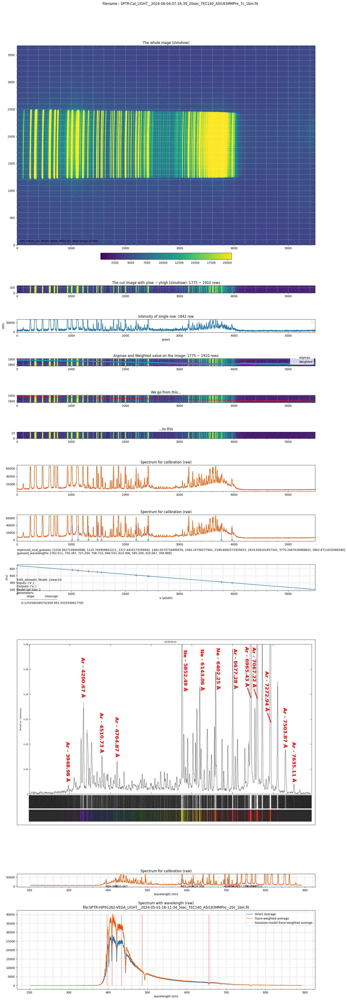

In [51]:
######################################################################################################
# fpath_cal = Path(summary_cal["file"][0])
hdul_cal = fits.open(fpath_cal)

##############################################################################
##############################################################################
# ##############################################
# # ylow, yhigh = 1775, 1910 
# ##############################################
# result = f"ylow:{ylow}\nyhigh:{yhigh}\n" 
# result += f"wei_ylow:{wei_ylow}\nwei_yhigh:{wei_yhigh}\n"
# result += f"xhigh:{xhigh}\n"
# result += f"npixels_to_cut:{npixels_to_cut}\n"

# yvals = np.argmax(hdul[0].data, axis=0)
# xvals = np.arange(hdul[0].data.shape[1])
# bad_pixels = (yvals < ylow) | (yvals > yhigh)

fig, axs = plt.subplots(12, 1, figsize=(18, 50), 
                        sharex=False, sharey=False, 
                        gridspec_kw={'height_ratios': [20, 1, 1, 1, 1, 1, 2, 2, 2, 18, 1, 6]})

im0 = _astro_utilities.zimshow(axs[0], 
                    hdul_cal[0].data,
                    origin="lower",
                    cmap = "viridis",
                    )
axs[0].xaxis.set_major_locator(ticker.AutoLocator())
axs[0].xaxis.set_minor_locator(ticker.AutoMinorLocator())
axs[0].yaxis.set_major_locator(ticker.AutoLocator())
axs[0].yaxis.set_minor_locator(ticker.AutoMinorLocator())
axs[0].set_title('The whole mage (zimshow)')
axs[0].annotate(f"Min value: {hdul_cal[0].data.min()}, Mean value: {hdul_cal[0].data.mean():.02f}, Max value: {hdul_cal[0].data.max()}", 
            xy=(15, 15), xycoords='axes pixels')
axs[0].xaxis.set_major_locator(ticker.AutoLocator())
axs[0].xaxis.set_minor_locator(ticker.AutoMinorLocator())
axs[0].grid(color='white', which='both', axis='both', ls='dotted')

##############################################################################
##############################################################################
im1 = _astro_utilities.zimshow(axs[1], 
                                hdul_cal[0].data[ylow:yhigh, :],
                                origin="lower",
                                cmap = "viridis",
                                )
axs[1].set_title(f'The cut image with ylow ~ yhigh (zimshow): {ylow} ~ {yhigh} rows')
axs[1].xaxis.set_major_locator(ticker.AutoLocator())
axs[1].xaxis.set_minor_locator(ticker.AutoMinorLocator())
axs[1].grid(color='white', which='both', axis='both', ls='dotted')

##############################################################################
##############################################################################
im2 = axs[2].plot(hdul_cal[0].data[int((ylow+yhigh)/2),:])
axs[2].set_xlabel('pixels')
axs[2].set_ylabel('ADU')
axs[2].set_xlim((0,hdul_cal[0].data.shape[1]))
axs[2].set_title(f'Intensity of single row: {int((ylow+yhigh)/2)} row')
axs[2].xaxis.set_major_locator(ticker.AutoLocator())
axs[2].xaxis.set_minor_locator(ticker.AutoMinorLocator())
axs[2].grid(color='white', which='both', axis='both', ls='dotted')
axs[2].legend(loc='best');

# we use a cutout around the traced line, so the Y-values are from that cutout
# the `repeat` command here is used to extend our Y-axis position values, which are 425, 426, ... 475
# along the X-direction.  The indexing with [:, None] adds a "dummy" axis along the second (x) dimension,
# then `repeat` copies our Y-axis values.  The resulting array has the same shape as our weight array,
# which is hdul[0].data[425:475, :] minus the median
# yaxis = np.repeat(np.arange(ylow, yhigh)[:,None],
#                 hdul_cal[0].data.shape[1], axis=1)
# background = np.median(hdul_cal[0].data)
# # moment 1 is the data-weighted average of the Y-axis coordinates
# weighted_yaxis_values = np.average(yaxis, axis=0,
#                                 weights=hdul_cal[0].data[ylow:yhigh,:] - background)
# print("weighted_yaxis_values ", weighted_yaxis_values)
# print("weighted_yaxis_values.shape :", weighted_yaxis_values.shape)

##############################################################################
##############################################################################
##############################################
# wei_ylow, wei_yhigh = 1800, 1880
##############################################

# we need to use the 'extent' keyword to have the axes correctly labeled
im3 = _astro_utilities.zimshow(axs[3], hdul_cal[0].data[ylow:yhigh,:],
        extent=[0,hdul_cal[0].data.shape[1],ylow,yhigh],
        origin="lower",
        cmap="viridis")
# plt.gca().set_aspect(10) # we stretch the image out by 10x in the y-direction
axs[3].plot(xvals[~bad_pixels], yvals[~bad_pixels], 'm+', label="Argmax", markersize=4, alpha=0.2)
axs[3].plot(xvals, weighted_yaxis_values, 'cx', label="Weighted", markersize=3, alpha=0.2)
axs[3].set_xlim((0,hdul_cal[0].data.shape[1]))
axs[3].set_ylim((ylow,yhigh))
axs[3].set_title(f'Argmax and Weighted value on the image: {ylow} ~ {yhigh} rows')
axs[3].xaxis.set_major_locator(ticker.AutoLocator())
axs[3].xaxis.set_minor_locator(ticker.AutoMinorLocator())
axs[3].grid(color='white', which='both', axis='both', ls='dotted')
axs[3].legend(loc='best');

##############################################################################
##############################################################################
# trace_model = Polynomial1D(degree=3, c0=1.86579601e+03, c1=-3.18121701e-03, 
#                            c2=-9.17086800e-06, c3=1.58600397e-09)
# 1.86579601e+03 -3.18121701e-03 -9.17086800e-06  1.58600397e-09]
# trace_profile_model = Gaussian1D(amplitude=123.84846797, mean=0.17719819, stddev=5.10872134)
trace_model = fitted_polymodel
xaxis = np.arange(hdul_cal[0].data.shape[1])
trace_center = trace_model(xaxis)

yaxis = np.arange(-npixels_to_cut, npixels_to_cut)
# model_trace_profile = trace_profile_model(yaxis)
# trace_center = fitted_polymodel(xvals)
cutouts = np.array([hdul_cal[0].data[int(yval)-npixels_to_cut:int(yval)+npixels_to_cut, ii]
                        for yval, ii in zip(trace_center, xvals)])

im4 = _astro_utilities.zimshow(axs[4], hdul_cal[0].data[ylow:yhigh,:], extent=[0,hdul_cal[0].data.shape[1],ylow,yhigh],
        origin="lower", cmap="viridis")
axs[4].plot(xvals, trace_center, color='r', label="trace center");
axs[4].xaxis.set_major_locator(ticker.AutoLocator())
axs[4].xaxis.set_minor_locator(ticker.AutoMinorLocator())
axs[4].grid(color='white', which='both', axis='both', ls='dotted')
axs[4].set_title("We go from this...")

im5 = _astro_utilities.zimshow(axs[5], cutouts.T, 
        origin="lower")
axs[5].xaxis.set_major_locator(ticker.AutoLocator())
axs[5].xaxis.set_minor_locator(ticker.AutoMinorLocator())
axs[5].set_xlim((0,hdul_cal[0].data.shape[1]))
axs[5].set_title("...to this")

# mean_trace_profile = (cutouts - background).mean(axis=0)
# trace_profile_xaxis = np.arange(-npixels_to_cut, npixels_to_cut)

# lmfitter = LevMarLSQFitter()
# guess = Gaussian1D(amplitude=mean_trace_profile.max(), mean=0, stddev=5)
# fitted_trace_profile = lmfitter(model=guess, x=trace_profile_xaxis, y=mean_trace_profile)
# model_trace_profile = fitted_trace_profile(trace_profile_xaxis)
# fitted_trace_profile

##############################################################################
##############################################################################
average_spectrum_cal = (cutouts - background).mean(axis=1)
trace_avg_spectrum_cal = np.array([np.average(
        hdul_cal[0].data[int(yval)-npixels_to_cut:int(yval)+npixels_to_cut, ii] - background,
        weights=mean_trace_profile)
                                for yval, ii in zip(trace_center, xvals)])
gaussian_trace_avg_spectrum_cal = np.array([np.average(
        hdul_cal[0].data[int(yval)-npixels_to_cut:int(yval)+npixels_to_cut, ii] - background,
        weights=model_trace_profile)
                                for yval, ii in zip(trace_center, xvals)])

im6 = axs[6].plot(average_spectrum_cal, label="Direct Average")
axs[6].plot(trace_avg_spectrum_cal, label='Trace-weighted average')
axs[6].plot(gaussian_trace_avg_spectrum_cal, label='Gaussian-model-Trace-weighted average', alpha=0.5, linewidth=0.5, color='r')
axs[6].set_xlim((0,hdul_cal[0].data.shape[1]))
axs[6].xaxis.set_major_locator(ticker.AutoLocator())
axs[6].xaxis.set_minor_locator(ticker.AutoMinorLocator())
axs[6].grid(color='white', which='both', axis='both', ls='dotted')
axs[6].set_title(f'Spectrum for calibration (raw)')

##############################################################################
##############################################################################
# # guessed_wavelengths = [667.728, 640.2, 585.2]  # Ar, Ne, Ne
# guessed_xvals = [600, 970, 1550]

improved_xval_guesses = [np.average(xaxis[g-npixels:g+npixels],
                                    weights=average_spectrum[g-npixels:g+npixels] - np.median(average_spectrum))
                         for g in guessed_xvals]
print("improved_xval_guesses :", improved_xval_guesses)
result += f"improved_xval_guesses:{improved_xval_guesses}\n"

im7 = axs[7].plot(average_spectrum_cal, label="Direct Average")
axs[7].plot(trace_avg_spectrum_cal, label='Trace-weighted average')
axs[7].plot(gaussian_trace_avg_spectrum_cal, label='Gaussian-model-Trace-weighted average', alpha=0.5, linewidth=0.5, color='r')
axs[7].plot(guessed_xvals, [100]*len(guessed_xvals), 'x')
axs[7].vlines(guessed_xvals, 0, 40000, 'b', alpha=0.5)
# axs[7].plot(improved_xval_guesses, [100]*len(guessed_xvals), 'r+', markersize=8);
# axs[7].vline(guessed_xvals, 0, 40000, 'b', alpha=0.5)
# axs[7].vline(improved_xval_guesses, 0, 40000, 'r', 5)
axs[7].set_xlim((0,hdul_cal[0].data.shape[1]))
axs[7].annotate(f"improved_xval_guesses: {improved_xval_guesses}\nguessed_wavelengths: {guessed_wavelengths}", 
            xy=(0, -0.5), xycoords='axes fraction', #     xy=(0, -15), xycoords='axes pixels'
            )
axs[7].xaxis.set_major_locator(ticker.AutoLocator())
axs[7].xaxis.set_minor_locator(ticker.AutoMinorLocator())
axs[7].grid(color='white', which='both', axis='both', ls='dotted')
axs[7].set_title(f'Spectrum for calibration (raw)')

##############################################################################
##############################################################################
linfitter = LinearLSQFitter()
wlmodel = Linear1D()
linfit_wlmodel = linfitter(model=wlmodel, x=improved_xval_guesses, y=guessed_wavelengths)
wavelengths = linfit_wlmodel(xaxis) * u.nm
print(f"linfit_wlmodel: {linfit_wlmodel}")
print(f"wavelengths: {wavelengths}")

# we adopt the minimum/maximum wavelength from our linear fit
minwave = wavelengths.min()
maxwave = wavelengths.max()
# then we search for atomic lines
# We are only interested in neutral lines, assuming the lamps are not hot enough to ionize the atoms
# mercury_lines = Nist.query(minwav=minwave,
#                            maxwav=maxwave,
#                            linename='Hg I')
# krypton_lines = Nist.query(minwav=minwave,
#                            maxwav=maxwave,
#                            linename='Kr I')
# neon_lines = Nist.query(minwav=minwave,
#                         maxwav=maxwave,
#                         linename='Ne I')

im8 = axs[8].plot(improved_xval_guesses, guessed_wavelengths, 'r+', markersize=8)
axs[8].plot(xaxis, wavelengths, '-')
axs[8].set_ylabel(r"$\lambda(x)$")
axs[8].set_xlabel(r"x (pixels)")
axs[8].set_xlim((0,hdul_cal[0].data.shape[1]))
axs[8].xaxis.set_major_locator(ticker.AutoLocator())
axs[8].xaxis.set_minor_locator(ticker.AutoMinorLocator())
axs[8].grid(which='both', axis='both', ls='dotted')

axs[8].annotate(f"linfit_wlmodel: {linfit_wlmodel}", 
            xy=(0, -0.5), xycoords='axes fraction', #     xy=(0, -15), xycoords='axes pixels'
            )

import matplotlib.image as mpimg

# Load the PNG image
image_path = 'Alpy_calibration.png'  # Replace with the actual path
image = mpimg.imread(image_path)

# Display the image using Matplotlib
axs[9].imshow(image)
axs[9].xaxis.set_visible(False)
axs[9].yaxis.set_visible(False)

##############################################################################
##############################################################################
# ne_keep = np.array([('*' not in x) and ('f' not in x) for x in neon_lines['Rel.']])
# ne_wl_tbl = neon_lines['Observed'][ne_keep]
# ne_rel_tbl = np.array([float(x) for x in neon_lines['Rel.'][ne_keep]])

# im2 = axs[2].plot(xaxis, average_spectrum, label="Direct Average")
# axs[2].plot(xaxis, trace_avg_spectrum, label='Trace-weighted average')
# axs[2].plot(xaxis, gaussian_trace_avg_spectrum, label='Gaussian-model-Trace-weighted average', alpha=0.5, linewidth=0.5, color='r')
im10 = axs[10].plot(wavelengths, average_spectrum_cal, label="Direct Average")
axs[10].plot(wavelengths, trace_avg_spectrum_cal, label='Trace-weighted average')
axs[10].plot(wavelengths, gaussian_trace_avg_spectrum_cal, label='Gaussian-model-Trace-weighted average', alpha=0.5, linewidth=0.5, color='r')
axs[10].plot(guessed_wavelengths, [100]*len(guessed_xvals), 'r+', markersize=8);
axs[10].vlines(guessed_wavelengths, 0, 40000, 'b', alpha=0.5);
for wl in guessed_wavelengths :
    axs[10].text(wl, -5000, wl);
# axs[2].vlines(neon_lines['Observed'], 0, 40000, 'y', alpha=0.25);
# pl.plot(wavelengths, ne_spectrum)
# axs[2].plot(ne_wl_tbl, ne_rel_tbl / ne_rel_tbl.max() * average_spectrum.max(), 'rx')
# axs[2].set_xlim((0,hdul[0].data.shape[1]))
axs[10].set_xlabel("wavelength (nm)")
axs[10].set_title(f'Spectrum for calibration (raw)')
axs[10].xaxis.set_major_locator(ticker.AutoLocator())
axs[10].xaxis.set_minor_locator(ticker.AutoMinorLocator())
axs[10].grid(which='both', axis='both', ls='dotted')

##############################################################################
##############################################################################
im11 = axs[11].plot(wavelengths, average_spectrum, label="Direct Average")
axs[11].plot(wavelengths, trace_avg_spectrum, label='Trace-weighted average')
axs[11].plot(wavelengths, gaussian_trace_avg_spectrum, label='Gaussian-model-Trace-weighted average', alpha=0.5, linewidth=0.5, color='r')
axs[11].vlines(HBalmer, 0, 40000, 'r', alpha=0.5)
axs[11].set_title(f'Spectrum with wavelength (raw)\nfile:{fpath.name}')
axs[11].set_xlabel("wavelength (nm)")
axs[11].legend(loc='best')
axs[11].xaxis.set_major_locator(ticker.AutoLocator())
axs[11].xaxis.set_minor_locator(ticker.AutoMinorLocator())
axs[11].grid(which='both', axis='both', ls='dotted')

axs[5].set_aspect(4) # we stretch the image out by 10x in the y-direction 

plt.suptitle(f'filename : {fpath_cal.name}')

# plt.colorbar(im0, fraction=0.031, pad=0.04)
plt.colorbar(im0, fraction=0.025, pad=0.03, location='bottom')
plt.tight_layout(pad=2.0)
plt.savefig(f"{TRACERESULTDIR}/{fpath.stem}_calibration.png")
                
plt.show()

## 잘 되던 것..

In [52]:
# ######################################################################################################
# # fpath_cal = Path(summary_cal["file"][0])
# hdul_cal = fits.open(fpath_cal)

# ##############################################################################
# ##############################################################################
# # ##############################################
# # # ylow, yhigh = 1775, 1910 
# # ##############################################
# # result = f"ylow:{ylow}\nyhigh:{yhigh}\n" 
# # result += f"wei_ylow:{wei_ylow}\nwei_yhigh:{wei_yhigh}\n"
# # result += f"xhigh:{xhigh}\n"
# # result += f"npixels_to_cut:{npixels_to_cut}\n"

# # yvals = np.argmax(hdul[0].data, axis=0)
# # xvals = np.arange(hdul[0].data.shape[1])
# # bad_pixels = (yvals < ylow) | (yvals > yhigh)

# fig, axs = plt.subplots(7, 1, figsize=(16, 22), 
#                         sharex=False, sharey=False, 
#                         gridspec_kw={'height_ratios': [15, 1, 1, 1, 1, 1, 2, ]})

# im0 = _astro_utilities.zimshow(axs[0], 
#                     hdul_cal[0].data,
#                     origin="lower",
#                     cmap = "viridis"
#                     )
# axs[0].set_title('The whole mage (zimshow)')
# axs[0].annotate(f"Min value: {hdul_cal[0].data.min()}, Mean value: {hdul_cal[0].data.mean():.02f}, Max value: {hdul_cal[0].data.max()}", 
#             xy=(15, -15), xycoords='axes pixels')

# ##############################################################################
# ##############################################################################
# im1 = _astro_utilities.zimshow(axs[1], 
#                                 hdul_cal[0].data[ylow:yhigh, :],
#                                 origin="lower",
#                                 cmap = "viridis",
#                                 )
# axs[1].set_title(f'The cut image with ylow ~ yhigh (zimshow): {ylow} ~ {yhigh} rows')

# ##############################################################################
# ##############################################################################
# im2 = axs[2].plot(hdul_cal[0].data[int((ylow+yhigh)/2),:])
# axs[2].set_xlabel('pixels')
# axs[2].set_ylabel('ADU')
# axs[2].set_xlim((0,hdul_cal[0].data.shape[1]))
# axs[2].set_title(f'Intensity of single row: {int((ylow+yhigh)/2)} row')
# axs[2].legend(loc='best');

# # we use a cutout around the traced line, so the Y-values are from that cutout
# # the `repeat` command here is used to extend our Y-axis position values, which are 425, 426, ... 475
# # along the X-direction.  The indexing with [:, None] adds a "dummy" axis along the second (x) dimension,
# # then `repeat` copies our Y-axis values.  The resulting array has the same shape as our weight array,
# # which is hdul[0].data[425:475, :] minus the median
# # yaxis = np.repeat(np.arange(ylow, yhigh)[:,None],
# #                 hdul_cal[0].data.shape[1], axis=1)
# # background = np.median(hdul_cal[0].data)
# # # moment 1 is the data-weighted average of the Y-axis coordinates
# # weighted_yaxis_values = np.average(yaxis, axis=0,
# #                                 weights=hdul_cal[0].data[ylow:yhigh,:] - background)
# # print("weighted_yaxis_values ", weighted_yaxis_values)
# # print("weighted_yaxis_values.shape :", weighted_yaxis_values.shape)

# ##############################################################################
# ##############################################################################
# ##############################################
# # wei_ylow, wei_yhigh = 1800, 1880
# ##############################################

# # we need to use the 'extent' keyword to have the axes correctly labeled
# im3 = _astro_utilities.zimshow(axs[3], hdul_cal[0].data[ylow:yhigh,:],
#         extent=[0,hdul_cal[0].data.shape[1],ylow,yhigh],
#         origin="lower",
#         cmap="viridis")
# # plt.gca().set_aspect(10) # we stretch the image out by 10x in the y-direction
# axs[3].plot(xvals[~bad_pixels], yvals[~bad_pixels], 'm+', label="Argmax", markersize=4, alpha=0.2)
# axs[3].plot(xvals, weighted_yaxis_values, 'cx', label="Weighted", markersize=3, alpha=0.2)
# axs[3].set_xlim((0,hdul_cal[0].data.shape[1]))
# axs[3].set_ylim((ylow,yhigh))
# axs[3].set_title(f'Argmax and Weighted value on the image: {ylow} ~ {yhigh} rows')
# axs[3].legend(loc='best');

# ##############################################################################
# ##############################################################################
# # trace_model = Polynomial1D(degree=3, c0=1.86579601e+03, c1=-3.18121701e-03, 
# #                            c2=-9.17086800e-06, c3=1.58600397e-09)
# # 1.86579601e+03 -3.18121701e-03 -9.17086800e-06  1.58600397e-09]
# # trace_profile_model = Gaussian1D(amplitude=123.84846797, mean=0.17719819, stddev=5.10872134)
# trace_model = fitted_polymodel
# xaxis = np.arange(hdul_cal[0].data.shape[1])
# trace_center = trace_model(xaxis)

# yaxis = np.arange(-npixels_to_cut, npixels_to_cut)
# # model_trace_profile = trace_profile_model(yaxis)
# # trace_center = fitted_polymodel(xvals)
# cutouts = np.array([hdul_cal[0].data[int(yval)-npixels_to_cut:int(yval)+npixels_to_cut, ii]
#                         for yval, ii in zip(trace_center, xvals)])

# im4 = _astro_utilities.zimshow(axs[4], hdul_cal[0].data[ylow:yhigh,:], extent=[0,hdul_cal[0].data.shape[1],ylow,yhigh],
#         origin="lower", cmap="viridis")
# axs[4].plot(xvals, trace_center, color='r', label="trace center");
# axs[4].set_title("We go from this...")

# im5 = _astro_utilities.zimshow(axs[5], cutouts.T, 
#         origin="lower")
# axs[5].set_xlim((0,hdul_cal[0].data.shape[1]))
# axs[5].set_title("...to this")

# # mean_trace_profile = (cutouts - background).mean(axis=0)
# # trace_profile_xaxis = np.arange(-npixels_to_cut, npixels_to_cut)

# # lmfitter = LevMarLSQFitter()
# # guess = Gaussian1D(amplitude=mean_trace_profile.max(), mean=0, stddev=5)
# # fitted_trace_profile = lmfitter(model=guess, x=trace_profile_xaxis, y=mean_trace_profile)
# # model_trace_profile = fitted_trace_profile(trace_profile_xaxis)
# # fitted_trace_profile

# ##############################################################################
# ##############################################################################
# average_spectrum_cal = (cutouts - background).mean(axis=1)
# trace_avg_spectrum_cal = np.array([np.average(
#         hdul_cal[0].data[int(yval)-npixels_to_cut:int(yval)+npixels_to_cut, ii] - background,
#         weights=mean_trace_profile)
#                                 for yval, ii in zip(trace_center, xvals)])
# gaussian_trace_avg_spectrum_cal = np.array([np.average(
#         hdul_cal[0].data[int(yval)-npixels_to_cut:int(yval)+npixels_to_cut, ii] - background,
#         weights=model_trace_profile)
#                                 for yval, ii in zip(trace_center, xvals)])

# im6 = axs[6].plot(average_spectrum_cal, label="Direct Average")
# axs[6].plot(trace_avg_spectrum_cal, label='Trace-weighted average')
# axs[6].plot(gaussian_trace_avg_spectrum_cal, label='Gaussian-model-Trace-weighted average', alpha=0.5, linewidth=0.5, color='r')
# axs[6].set_xlim((0,hdul_cal[0].data.shape[1]))
# axs[6].set_title(f'Spectrum (raw)')

# axs[5].set_aspect(2) # we stretch the image out by 10x in the y-direction 

# plt.suptitle(f'filename : {fpath_cal.name}')

# # plt.colorbar(im0, fraction=0.031, pad=0.04)
# plt.colorbar(im0, fraction=0.025, pad=0.03, location='bottom')
# plt.tight_layout(pad=2.0)
# plt.savefig(f"{TRACERESULTDIR}/{fpath.stem}_calibration.png")
                
# plt.show()

## 잘 되던것.

In [53]:
# ######################################################################################################
# # # guessed_wavelengths = [667.728, 640.2, 585.2]  # Ar, Ne, Ne
# # guessed_xvals = [600, 970, 1550]

# improved_xval_guesses = [np.average(xaxis[g-npixels:g+npixels],
#                                     weights=average_spectrum[g-npixels:g+npixels] - np.median(average_spectrum))
#                          for g in guessed_xvals]
# improved_xval_guesses
# result += f"improved_xval_guesses:{improved_xval_guesses}\n"
# fig, axs = plt.subplots(4, 1, figsize=(16, 12), 
#                         sharex=False, sharey=False, 
#                         gridspec_kw={'height_ratios': [1, 2, 1, 6]},
#                         )

# im0 = axs[0].plot(average_spectrum_cal, label="Direct Average")
# axs[0].plot(trace_avg_spectrum_cal, label='Trace-weighted average')
# axs[0].plot(gaussian_trace_avg_spectrum_cal, label='Gaussian-model-Trace-weighted average', alpha=0.5, linewidth=0.5, color='r')
# axs[0].plot(guessed_xvals, [100]*len(guessed_xvals), 'x')
# axs[0].plot(improved_xval_guesses, [100]*len(guessed_xvals), 'b+');
# axs[0].set_xlim((0,hdul_cal[0].data.shape[1]))
# axs[0].set_title(f'Spectrum for calibration (raw)')


# linfitter = LinearLSQFitter()
# wlmodel = Linear1D()
# linfit_wlmodel = linfitter(model=wlmodel, x=improved_xval_guesses, y=guessed_wavelengths)
# wavelengths = linfit_wlmodel(xaxis) * u.nm
# print(f"linfit_wlmodel: {linfit_wlmodel}")
# print(f"wavelengths: {wavelengths}")

# # we adopt the minimum/maximum wavelength from our linear fit
# minwave = wavelengths.min()
# maxwave = wavelengths.max()
# # then we search for atomic lines
# # We are only interested in neutral lines, assuming the lamps are not hot enough to ionize the atoms
# # mercury_lines = Nist.query(minwav=minwave,
# #                            maxwav=maxwave,
# #                            linename='Hg I')
# # krypton_lines = Nist.query(minwav=minwave,
# #                            maxwav=maxwave,
# #                            linename='Kr I')
# # neon_lines = Nist.query(minwav=minwave,
# #                         maxwav=maxwave,
# #                         linename='Ne I')

# im1 = axs[1].plot(improved_xval_guesses, guessed_wavelengths, 'o')
# axs[1].plot(xaxis, wavelengths, '-')
# axs[1].set_ylabel("$\lambda(x)$")
# axs[1].set_xlabel("x (pixels)")
# axs[1].set_xlim((0,hdul_cal[0].data.shape[1]))

# # ne_keep = np.array([('*' not in x) and ('f' not in x) for x in neon_lines['Rel.']])
# # ne_wl_tbl = neon_lines['Observed'][ne_keep]
# # ne_rel_tbl = np.array([float(x) for x in neon_lines['Rel.'][ne_keep]])

# # im2 = axs[2].plot(xaxis, average_spectrum, label="Direct Average")
# # axs[2].plot(xaxis, trace_avg_spectrum, label='Trace-weighted average')
# # axs[2].plot(xaxis, gaussian_trace_avg_spectrum, label='Gaussian-model-Trace-weighted average', alpha=0.5, linewidth=0.5, color='r')
# im2 = axs[2].plot(wavelengths, average_spectrum_cal, label="Direct Average")
# axs[2].plot(wavelengths, trace_avg_spectrum_cal, label='Trace-weighted average')
# axs[2].plot(wavelengths, gaussian_trace_avg_spectrum_cal, label='Gaussian-model-Trace-weighted average', alpha=0.5, linewidth=0.5, color='r')
# axs[2].plot(guessed_wavelengths, [100]*len(guessed_xvals), 'x');
# axs[2].vlines(guessed_wavelengths, 0, 40000, 'b', alpha=0.5);
# # axs[2].vlines(neon_lines['Observed'], 0, 40000, 'y', alpha=0.25);
# # pl.plot(wavelengths, ne_spectrum)
# # axs[2].plot(ne_wl_tbl, ne_rel_tbl / ne_rel_tbl.max() * average_spectrum.max(), 'rx')
# # axs[2].set_xlim((0,hdul[0].data.shape[1]))
# axs[2].set_title(f'Spectrum for calibration (raw)')

# im3 = axs[3].plot(wavelengths, average_spectrum, label="Direct Average")
# axs[3].plot(wavelengths, trace_avg_spectrum, label='Trace-weighted average')
# axs[3].plot(wavelengths, gaussian_trace_avg_spectrum, label='Gaussian-model-Trace-weighted average', alpha=0.5, linewidth=0.5, color='r')
# axs[3].set_title(f'Spectrum with wavelength (raw)')
# axs[3].legend(loc='best')

# plt.suptitle(f'filename : {fpath.name}')

# # plt.colorbar(im1, fraction=0.031, pad=0.04)
# plt.tight_layout(pad=2.0)
# plt.savefig(f"{TRACERESULTDIR}/{fpath.stem}_wavelength_spctrum.png")
                
# plt.show()

# Save


In [54]:
print(type(fitted_polymodel))
print(dir(fitted_polymodel))
result += f"fitted_polymodel.parameters:{fitted_polymodel.parameters}\n"
result += f"wavelengths(unit):{wavelengths.unit.to_string()}\n"
result += f"wavelengths:{wavelengths.value.tolist()}\n"
result += f"Direct average:{average_spectrum.tolist()}\n"
result += f"Trace-weighted average:{trace_avg_spectrum.tolist()}\n"
result += f"Gaussian-model-Trace-weighted average:{gaussian_trace_avg_spectrum.tolist()}\n"
result += f"Direct average_cal:{average_spectrum_cal.tolist()}\n"
result += f"Trace-weighted average_cal:{trace_avg_spectrum_cal.tolist()}\n"
result += f"Gaussian-model-Trace-weighted average_cal:{gaussian_trace_avg_spectrum_cal.tolist()}\n"


with open(f"{TRACERESULTDIR}/{fpath.stem}_spctrum_result.txt", 'w') as f:
    f.write(result) 

<class 'astropy.modeling.polynomial.Polynomial1D'>
Name: Polynomial1D
N_inputs: 1
N_outputs: 1
Fittable parameters: <property object at 0x7f588e0b68e0>
['__abstractmethods__', '__add__', '__and__', '__call__', '__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__getstate__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__len__', '__lt__', '__module__', '__mul__', '__ne__', '__new__', '__or__', '__pow__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__slotnames__', '__str__', '__sub__', '__subclasshook__', '__truediv__', '__weakref__', '_abc_impl', '_argnames', '_array_to_parameters', '_bounding_box', '_bounds', '_calculate_separability_matrix', '_check_param_broadcast', '_cov_matrix', '_default_domain_window', '_default_inputs_outputs', '_degree', '_domain', '_fix_inputs', '_fixed', '_format_repr', '_format_str', '_generate_coeff_names', '_generic_evaluate', '_get_renamed_

## 추가

improved_xval_guesses : [1018.5627148404986, 1125.764908852211, 1317.4424173299992, 1482.0574716890676, 1560.16756277901, 2199.6892572929423, 2419.926201657341, 3770.2487428988843, 3962.6711035066596]
linfit_wlmodel: Model: Linear1D
Inputs: ('x',)
Outputs: ('y',)
Model set size: 1
Parameters:
           slope            intercept    
    ------------------- -----------------
    -0.1253584269742949 891.4325540817705
wavelengths: [891.43255408 891.30719565 891.18183723 ... 202.83871471 202.71335628
 202.58799786] nm


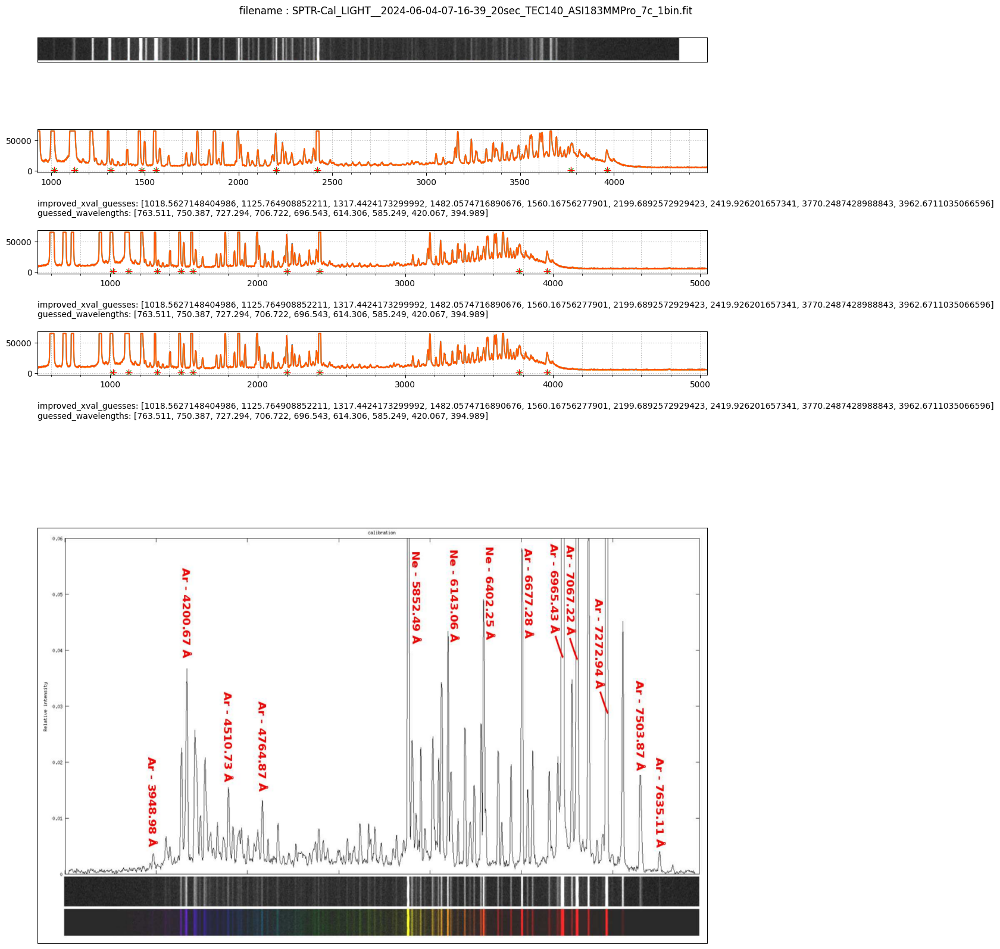

In [55]:
######################################################################################################
# fpath_cal = Path(summary_cal["file"][0])
hdul_cal = fits.open(fpath_cal)

##############################################################################
##############################################################################
# ##############################################
# # ylow, yhigh = 1775, 1910 
# ##############################################
# result = f"ylow:{ylow}\nyhigh:{yhigh}\n" 
# result += f"wei_ylow:{wei_ylow}\nwei_yhigh:{wei_yhigh}\n"
# result += f"xhigh:{xhigh}\n"
# result += f"npixels_to_cut:{npixels_to_cut}\n"

# yvals = np.argmax(hdul[0].data, axis=0)
# xvals = np.arange(hdul[0].data.shape[1])
# bad_pixels = (yvals < ylow) | (yvals > yhigh)

fig, axs = plt.subplots(5, 1, figsize=(16, 18), 
                        sharex=False, sharey=False, 
                        gridspec_kw={'height_ratios': [1, 1, 1, 1, 14]}
                        # gridspec_kw={'height_ratios': [4, 1, 1, 1, 20, 1, 6]}
                        )

##############################################################################
##############################################################################
# im0 = axs[0].plot(hdul_cal[0].data[int((ylow+yhigh)/2),:])
# axs[0].set_xlabel('pixels')
# axs[0].set_ylabel('ADU')
# axs[0].set_xlim((0,hdul_cal[0].data.shape[1]))
# axs[0].set_title(f'Intensity of single row: {int((ylow+yhigh)/2)} row')
# axs[0].legend(loc='best');

# we use a cutout around the traced line, so the Y-values are from that cutout
# the `repeat` command here is used to extend our Y-axis position values, which are 425, 426, ... 475
# along the X-direction.  The indexing with [:, None] adds a "dummy" axis along the second (x) dimension,
# then `repeat` copies our Y-axis values.  The resulting array has the same shape as our weight array,
# which is hdul[0].data[425:475, :] minus the median
# yaxis = np.repeat(np.arange(ylow, yhigh)[:,None],
#                 hdul_cal[0].data.shape[1], axis=1)
# background = np.median(hdul_cal[0].data)
# # moment 1 is the data-weighted average of the Y-axis coordinates
# weighted_yaxis_values = np.average(yaxis, axis=0,
#                                 weights=hdul_cal[0].data[ylow:yhigh,:] - background)
# print("weighted_yaxis_values ", weighted_yaxis_values)
# print("weighted_yaxis_values.shape :", weighted_yaxis_values.shape)

##############################################################################
##############################################################################
##############################################
# wei_ylow, wei_yhigh = 1800, 1880
##############################################

# we need to use the 'extent' keyword to have the axes correctly labeled
# im1 = _astro_utilities.zimshow(axs[1], hdul_cal[0].data[ylow:yhigh,:],
#         extent=[0,hdul_cal[0].data.shape[1],ylow,yhigh],
#         origin="lower",
#         cmap="viridis")

# # plt.gca().set_aspect(10) # we stretch the image out by 10x in the y-direction
# axs[1].plot(xvals[~bad_pixels], yvals[~bad_pixels], 'm+', label="Argmax", markersize=4, alpha=0.2)
# axs[1].plot(xvals, weighted_yaxis_values, 'cx', label="Weighted", markersize=3, alpha=0.2)
# axs[1].set_xlim((0,hdul_cal[0].data.shape[1]))
# axs[1].set_ylim((ylow,yhigh))
# axs[1].set_title(f'Argmax and Weighted value on the image: {ylow} ~ {yhigh} rows')
# axs[1].legend(loc='best');

##############################################################################
##############################################################################
# trace_model = Polynomial1D(degree=3, c0=1.86579601e+03, c1=-3.18121701e-03, 
#                            c2=-9.17086800e-06, c3=1.58600397e-09)
# 1.86579601e+03 -3.18121701e-03 -9.17086800e-06  1.58600397e-09]
# trace_profile_model = Gaussian1D(amplitude=123.84846797, mean=0.17719819, stddev=5.10872134)
trace_model = fitted_polymodel
xaxis = np.arange(hdul_cal[0].data.shape[1])
trace_center = trace_model(xaxis)

yaxis = np.arange(-npixels_to_cut, npixels_to_cut)
# model_trace_profile = trace_profile_model(yaxis)
# trace_center = fitted_polymodel(xvals)
cutouts = np.array([hdul_cal[0].data[int(yval)-npixels_to_cut:int(yval)+npixels_to_cut, ii]
                        for yval, ii in zip(trace_center, xvals)])

# im4 = _astro_utilities.zimshow(axs[4], hdul_cal[0].data[ylow:yhigh,:], extent=[0,hdul_cal[0].data.shape[1],ylow,yhigh],
#         origin="lower", cmap="viridis")
# axs[4].plot(xvals, trace_center, color='r', label="trace center");
# axs[4].set_title("We go from this...")

# im2 = _astro_utilities.zimshow(axs[2], cutouts.T, 
#         origin="lower")
# axs[2].set_xlim((0,hdul_cal[0].data.shape[1]))
# axs[2].set_title("...to this")

# mean_trace_profile = (cutouts - background).mean(axis=0)
# trace_profile_xaxis = np.arange(-npixels_to_cut, npixels_to_cut)

# lmfitter = LevMarLSQFitter()
# guess = Gaussian1D(amplitude=mean_trace_profile.max(), mean=0, stddev=5)
# fitted_trace_profile = lmfitter(model=guess, x=trace_profile_xaxis, y=mean_trace_profile)
# model_trace_profile = fitted_trace_profile(trace_profile_xaxis)
# fitted_trace_profile

##############################################################################
##############################################################################
average_spectrum_cal = (cutouts - background).mean(axis=1)
trace_avg_spectrum_cal = np.array([np.average(
        hdul_cal[0].data[int(yval)-npixels_to_cut:int(yval)+npixels_to_cut, ii] - background,
        weights=mean_trace_profile)
                                for yval, ii in zip(trace_center, xvals)])
gaussian_trace_avg_spectrum_cal = np.array([np.average(
        hdul_cal[0].data[int(yval)-npixels_to_cut:int(yval)+npixels_to_cut, ii] - background,
        weights=model_trace_profile)
                                for yval, ii in zip(trace_center, xvals)])

# im6 = axs[6].plot(average_spectrum_cal, label="Direct Average")
# axs[6].plot(trace_avg_spectrum_cal, label='Trace-weighted average')
# axs[6].plot(gaussian_trace_avg_spectrum_cal, label='Gaussian-model-Trace-weighted average', alpha=0.5, linewidth=0.5, color='r')
# axs[6].set_xlim((0,hdul_cal[0].data.shape[1]))
# axs[6].set_title(f'Spectrum for calibration (raw)')

##############################################################################
##############################################################################
# # guessed_wavelengths = [667.728, 640.2, 585.2]  # Ar, Ne, Ne
# guessed_xvals = [600, 970, 1550]

improved_xval_guesses = [np.average(xaxis[g-npixels:g+npixels],
                                    weights=average_spectrum[g-npixels:g+npixels] - np.median(average_spectrum))
                         for g in guessed_xvals]
print(f"improved_xval_guesses :", improved_xval_guesses)
result += f"improved_xval_guesses:{improved_xval_guesses}\n"

im1 = axs[1].plot(average_spectrum_cal, label="Direct Average")
axs[1].plot(trace_avg_spectrum_cal, label='Trace-weighted average')
axs[1].plot(gaussian_trace_avg_spectrum_cal, label='Gaussian-model-Trace-weighted average', alpha=0.5, linewidth=0.5, color='r')
axs[1].plot(guessed_xvals, [100]*len(guessed_xvals), 'x')
axs[1].plot(improved_xval_guesses, [100]*len(guessed_xvals), 'r+', markersize=8);
axs[1].set_xlim((930,hdul_cal[0].data.shape[1]-1000))
axs[1].annotate(f"improved_xval_guesses: {improved_xval_guesses}\nguessed_wavelengths: {guessed_wavelengths}", 
            xy=(0, -1), xycoords='axes fraction', #     xy=(0, -15), xycoords='axes pixels'
            )
# axs[1].set_title(f'Spectrum for calibration (raw)')
axs[1].xaxis.set_major_locator(ticker.AutoLocator())
axs[1].xaxis.set_minor_locator(ticker.AutoMinorLocator())
axs[1].grid(which='both', axis='both', ls='dotted')


im2 = axs[2].plot(average_spectrum_cal, label="Direct Average")
axs[2].plot(trace_avg_spectrum_cal, label='Trace-weighted average')
axs[2].plot(gaussian_trace_avg_spectrum_cal, label='Gaussian-model-Trace-weighted average', alpha=0.5, linewidth=0.5, color='r')
axs[2].plot(guessed_xvals, [100]*len(guessed_xvals), 'x')
axs[2].plot(improved_xval_guesses, [100]*len(guessed_xvals), 'r+', markersize=8);
axs[2].set_xlim((510,hdul_cal[0].data.shape[1]-450))
axs[2].annotate(f"improved_xval_guesses: {improved_xval_guesses}\nguessed_wavelengths: {guessed_wavelengths}", 
            xy=(0, -1), xycoords='axes fraction', #     xy=(0, -15), xycoords='axes pixels'
            )
# axs[1].set_title(f'Spectrum for calibration (raw)')
axs[2].xaxis.set_major_locator(ticker.AutoLocator())
axs[2].xaxis.set_minor_locator(ticker.AutoMinorLocator())
axs[2].grid(which='both', axis='both', ls='dotted')


im3 = axs[3].plot(average_spectrum_cal, label="Direct Average")
axs[3].plot(trace_avg_spectrum_cal, label='Trace-weighted average')
axs[3].plot(gaussian_trace_avg_spectrum_cal, label='Gaussian-model-Trace-weighted average', alpha=0.5, linewidth=0.5, color='r')
axs[3].plot(guessed_xvals, [100]*len(guessed_xvals), 'x')
axs[3].plot(improved_xval_guesses, [100]*len(guessed_xvals), 'r+', markersize=8);
axs[3].set_xlim((510,hdul_cal[0].data.shape[1]-450))
axs[3].annotate(f"improved_xval_guesses: {improved_xval_guesses}\nguessed_wavelengths: {guessed_wavelengths}", 
            xy=(0, -1), xycoords='axes fraction', #     xy=(0, -15), xycoords='axes pixels'
            )
# axs[1].set_title(f'Spectrum for calibration (raw)')
axs[3].xaxis.set_major_locator(ticker.AutoLocator())
axs[3].xaxis.set_minor_locator(ticker.AutoMinorLocator())
axs[3].grid(which='both', axis='both', ls='dotted')

##############################################################################
##############################################################################
linfitter = LinearLSQFitter()
wlmodel = Linear1D()
linfit_wlmodel = linfitter(model=wlmodel, x=improved_xval_guesses, y=guessed_wavelengths)
wavelengths = linfit_wlmodel(xaxis) * u.nm
print(f"linfit_wlmodel: {linfit_wlmodel}")
print(f"wavelengths: {wavelengths}")

# we adopt the minimum/maximum wavelength from our linear fit
minwave = wavelengths.min()
maxwave = wavelengths.max()
# then we search for atomic lines
# We are only interested in neutral lines, assuming the lamps are not hot enough to ionize the atoms
# mercury_lines = Nist.query(minwav=minwave,
#                            maxwav=maxwave,
#                            linename='Hg I')
# krypton_lines = Nist.query(minwav=minwave,
#                            maxwav=maxwave,
#                            linename='Kr I')
# neon_lines = Nist.query(minwav=minwave,
#                         maxwav=maxwave,
#                         linename='Ne I')

# im3 = axs[3].plot(improved_xval_guesses, guessed_wavelengths, 'r+', markersize=8)
# axs[3].plot(xaxis, wavelengths, '-')
# axs[3].set_ylabel("$\lambda(x)$")
# axs[3].set_xlabel("x (pixels)")
# axs[3].set_xlim((0,hdul_cal[0].data.shape[1]))

import matplotlib.image as mpimg

# Load the PNG image
image_path = 'Alpy_calibration.png'  # Replace with the actual path
image = mpimg.imread(image_path)

# Display the image using Matplotlib
im4 = axs[4].imshow(image)
axs[4].xaxis.set_visible(False)
axs[4].yaxis.set_visible(False)

# Display the image using Matplotlib
# np.flip(hdul[0].data[1500:2000, :], axis=1)
im0 = axs[0].imshow(np.flip(image[700:745, :1250 ,:], axis=1))
axs[0].xaxis.set_visible(False)
axs[0].yaxis.set_visible(False)


##############################################################################
##############################################################################
# ne_keep = np.array([('*' not in x) and ('f' not in x) for x in neon_lines['Rel.']])
# ne_wl_tbl = neon_lines['Observed'][ne_keep]
# ne_rel_tbl = np.array([float(x) for x in neon_lines['Rel.'][ne_keep]])

# im2 = axs[2].plot(xaxis, average_spectrum, label="Direct Average")
# axs[2].plot(xaxis, trace_avg_spectrum, label='Trace-weighted average')
# axs[2].plot(xaxis, gaussian_trace_avg_spectrum, label='Gaussian-model-Trace-weighted average', alpha=0.5, linewidth=0.5, color='r')
# im5 = axs[5].plot(wavelengths, average_spectrum_cal, label="Direct Average")
# axs[5].plot(wavelengths, trace_avg_spectrum_cal, label='Trace-weighted average')
# axs[5].plot(wavelengths, gaussian_trace_avg_spectrum_cal, label='Gaussian-model-Trace-weighted average', alpha=0.5, linewidth=0.5, color='r')
# axs[5].plot(guessed_wavelengths, [100]*len(guessed_xvals), 'r+', markersize=8);
# axs[5].vlines(guessed_wavelengths, 0, 40000, 'b', alpha=0.5);
# for wl in guessed_wavelengths :
#     axs[5].text(wl, 0, wl);
# axs[2].vlines(neon_lines['Observed'], 0, 40000, 'y', alpha=0.25);
# pl.plot(wavelengths, ne_spectrum)
# axs[2].plot(ne_wl_tbl, ne_rel_tbl / ne_rel_tbl.max() * average_spectrum.max(), 'rx')
# axs[2].set_xlim((0,hdul[0].data.shape[1]))
# axs[5].set_xlabel("wavelength (nm)")
# axs[5].set_title(f'Spectrum for calibration (raw)')

##############################################################################
##############################################################################
# im6 = axs[6].plot(wavelengths, average_spectrum, label="Direct Average")
# axs[6].plot(wavelengths, trace_avg_spectrum, label='Trace-weighted average')
# axs[6].plot(wavelengths, gaussian_trace_avg_spectrum, label='Gaussian-model-Trace-weighted average', alpha=0.5, linewidth=0.5, color='r')
# axs[6].set_title(f'Spectrum with wavelength (raw)\nfile:{fpath.name}')
# axs[6].set_xlabel("wavelength (nm)")
# axs[6].legend(loc='best')

# axs[2].set_aspect(4) # we stretch the image out by 10x in the y-direction 
# # axs[8].set_aspect(2) # we stretch the image out by 10x in the y-direction 
# axs[9].set_aspect(2) # we stretch the image out by 10x in the y-direction 

plt.suptitle(f'filename : {fpath_cal.name}')

# plt.colorbar(im0, fraction=0.031, pad=0.04)
# plt.colorbar(im0, fraction=0.025, pad=0.03, location='bottom')
plt.tight_layout(pad=2.0)
plt.savefig(f"{TRACERESULTDIR}/{fpath.stem}_calibration-2.png")
                
plt.show()

<>:167: SyntaxWarning: invalid escape sequence '\l'
<>:167: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_973867/2654719698.py:167: SyntaxWarning: invalid escape sequence '\l'
  axs[3].set_ylabel("$\lambda(x)$")


linfit_wlmodel: Model: Linear1D
Inputs: ('x',)
Outputs: ('y',)
Model set size: 1
Parameters:
           slope            intercept    
    ------------------- -----------------
    -0.1253584269742949 891.4325540817705
wavelengths: [891.43255408 891.30719565 891.18183723 ... 202.83871471 202.71335628
 202.58799786] nm


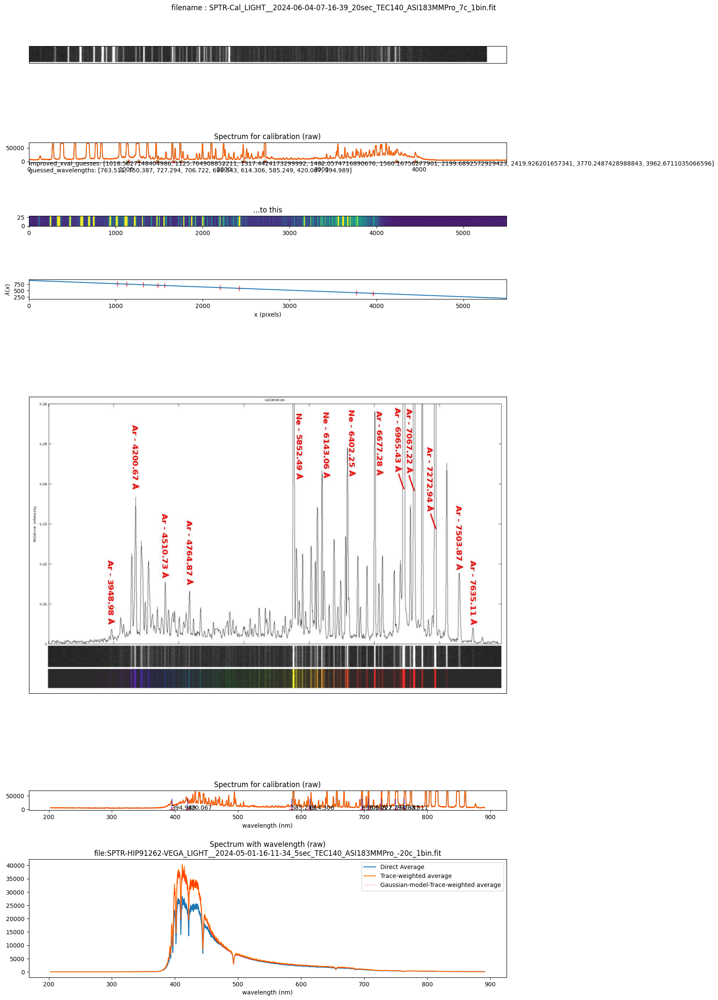

In [56]:
######################################################################################################
# fpath_cal = Path(summary_cal["file"][0])
hdul_cal = fits.open(fpath_cal)

##############################################################################
##############################################################################
# ##############################################
# # ylow, yhigh = 1775, 1910 
# ##############################################
# result = f"ylow:{ylow}\nyhigh:{yhigh}\n" 
# result += f"wei_ylow:{wei_ylow}\nwei_yhigh:{wei_yhigh}\n"
# result += f"xhigh:{xhigh}\n"
# result += f"npixels_to_cut:{npixels_to_cut}\n"

# yvals = np.argmax(hdul[0].data, axis=0)
# xvals = np.arange(hdul[0].data.shape[1])
# bad_pixels = (yvals < ylow) | (yvals > yhigh)

fig, axs = plt.subplots(7, 1, figsize=(16, 24), 
                        sharex=False, sharey=False, 
                        gridspec_kw={'height_ratios': [4, 1, 1, 1, 20, 1, 6]})

##############################################################################
##############################################################################
# im0 = axs[0].plot(hdul_cal[0].data[int((ylow+yhigh)/2),:])
# axs[0].set_xlabel('pixels')
# axs[0].set_ylabel('ADU')
# axs[0].set_xlim((0,hdul_cal[0].data.shape[1]))
# axs[0].set_title(f'Intensity of single row: {int((ylow+yhigh)/2)} row')
# axs[0].legend(loc='best');

# we use a cutout around the traced line, so the Y-values are from that cutout
# the `repeat` command here is used to extend our Y-axis position values, which are 425, 426, ... 475
# along the X-direction.  The indexing with [:, None] adds a "dummy" axis along the second (x) dimension,
# then `repeat` copies our Y-axis values.  The resulting array has the same shape as our weight array,
# which is hdul[0].data[425:475, :] minus the median
# yaxis = np.repeat(np.arange(ylow, yhigh)[:,None],
#                 hdul_cal[0].data.shape[1], axis=1)
# background = np.median(hdul_cal[0].data)
# # moment 1 is the data-weighted average of the Y-axis coordinates
# weighted_yaxis_values = np.average(yaxis, axis=0,
#                                 weights=hdul_cal[0].data[ylow:yhigh,:] - background)
# print("weighted_yaxis_values ", weighted_yaxis_values)
# print("weighted_yaxis_values.shape :", weighted_yaxis_values.shape)

##############################################################################
##############################################################################
##############################################
# wei_ylow, wei_yhigh = 1800, 1880
##############################################

# we need to use the 'extent' keyword to have the axes correctly labeled
# im1 = _astro_utilities.zimshow(axs[1], hdul_cal[0].data[ylow:yhigh,:],
#         extent=[0,hdul_cal[0].data.shape[1],ylow,yhigh],
#         origin="lower",
#         cmap="viridis")

# # plt.gca().set_aspect(10) # we stretch the image out by 10x in the y-direction
# axs[1].plot(xvals[~bad_pixels], yvals[~bad_pixels], 'm+', label="Argmax", markersize=4, alpha=0.2)
# axs[1].plot(xvals, weighted_yaxis_values, 'cx', label="Weighted", markersize=3, alpha=0.2)
# axs[1].set_xlim((0,hdul_cal[0].data.shape[1]))
# axs[1].set_ylim((ylow,yhigh))
# axs[1].set_title(f'Argmax and Weighted value on the image: {ylow} ~ {yhigh} rows')
# axs[1].legend(loc='best');

##############################################################################
##############################################################################
# trace_model = Polynomial1D(degree=3, c0=1.86579601e+03, c1=-3.18121701e-03, 
#                            c2=-9.17086800e-06, c3=1.58600397e-09)
# 1.86579601e+03 -3.18121701e-03 -9.17086800e-06  1.58600397e-09]
# trace_profile_model = Gaussian1D(amplitude=123.84846797, mean=0.17719819, stddev=5.10872134)
trace_model = fitted_polymodel
xaxis = np.arange(hdul_cal[0].data.shape[1])
trace_center = trace_model(xaxis)

yaxis = np.arange(-npixels_to_cut, npixels_to_cut)
# model_trace_profile = trace_profile_model(yaxis)
# trace_center = fitted_polymodel(xvals)
cutouts = np.array([hdul_cal[0].data[int(yval)-npixels_to_cut:int(yval)+npixels_to_cut, ii]
                        for yval, ii in zip(trace_center, xvals)])

# im4 = _astro_utilities.zimshow(axs[4], hdul_cal[0].data[ylow:yhigh,:], extent=[0,hdul_cal[0].data.shape[1],ylow,yhigh],
#         origin="lower", cmap="viridis")
# axs[4].plot(xvals, trace_center, color='r', label="trace center");
# axs[4].set_title("We go from this...")

im2 = _astro_utilities.zimshow(axs[2], cutouts.T, 
        origin="lower")
axs[2].set_xlim((0,hdul_cal[0].data.shape[1]))
axs[2].set_title("...to this")

# mean_trace_profile = (cutouts - background).mean(axis=0)
# trace_profile_xaxis = np.arange(-npixels_to_cut, npixels_to_cut)

# lmfitter = LevMarLSQFitter()
# guess = Gaussian1D(amplitude=mean_trace_profile.max(), mean=0, stddev=5)
# fitted_trace_profile = lmfitter(model=guess, x=trace_profile_xaxis, y=mean_trace_profile)
# model_trace_profile = fitted_trace_profile(trace_profile_xaxis)
# fitted_trace_profile

##############################################################################
##############################################################################
average_spectrum_cal = (cutouts - background).mean(axis=1)
trace_avg_spectrum_cal = np.array([np.average(
        hdul_cal[0].data[int(yval)-npixels_to_cut:int(yval)+npixels_to_cut, ii] - background,
        weights=mean_trace_profile)
                                for yval, ii in zip(trace_center, xvals)])
gaussian_trace_avg_spectrum_cal = np.array([np.average(
        hdul_cal[0].data[int(yval)-npixels_to_cut:int(yval)+npixels_to_cut, ii] - background,
        weights=model_trace_profile)
                                for yval, ii in zip(trace_center, xvals)])

# im6 = axs[6].plot(average_spectrum_cal, label="Direct Average")
# axs[6].plot(trace_avg_spectrum_cal, label='Trace-weighted average')
# axs[6].plot(gaussian_trace_avg_spectrum_cal, label='Gaussian-model-Trace-weighted average', alpha=0.5, linewidth=0.5, color='r')
# axs[6].set_xlim((0,hdul_cal[0].data.shape[1]))
# axs[6].set_title(f'Spectrum for calibration (raw)')

##############################################################################
##############################################################################
# # guessed_wavelengths = [667.728, 640.2, 585.2]  # Ar, Ne, Ne
# guessed_xvals = [600, 970, 1550]

improved_xval_guesses = [np.average(xaxis[g-npixels:g+npixels],
                                    weights=average_spectrum[g-npixels:g+npixels] - np.median(average_spectrum))
                         for g in guessed_xvals]
improved_xval_guesses
result += f"improved_xval_guesses:{improved_xval_guesses}\n"

im1 = axs[1].plot(average_spectrum_cal, label="Direct Average")
axs[1].plot(trace_avg_spectrum_cal, label='Trace-weighted average')
axs[1].plot(gaussian_trace_avg_spectrum_cal, label='Gaussian-model-Trace-weighted average', alpha=0.5, linewidth=0.5, color='r')
axs[1].plot(guessed_xvals, [100]*len(guessed_xvals), 'x')
axs[1].plot(improved_xval_guesses, [100]*len(guessed_xvals), 'r+', markersize=8);
axs[1].set_xlim((0,hdul_cal[0].data.shape[1]-600))
axs[1].annotate(f"improved_xval_guesses: {improved_xval_guesses}\nguessed_wavelengths: {guessed_wavelengths}", 
            xy=(0, -0.5), xycoords='axes fraction', #     xy=(0, -15), xycoords='axes pixels'
            )
axs[1].set_title(f'Spectrum for calibration (raw)')

##############################################################################
##############################################################################
linfitter = LinearLSQFitter()
wlmodel = Linear1D()
linfit_wlmodel = linfitter(model=wlmodel, x=improved_xval_guesses, y=guessed_wavelengths)
wavelengths = linfit_wlmodel(xaxis) * u.nm
print(f"linfit_wlmodel: {linfit_wlmodel}")
print(f"wavelengths: {wavelengths}")

# we adopt the minimum/maximum wavelength from our linear fit
minwave = wavelengths.min()
maxwave = wavelengths.max()
# then we search for atomic lines
# We are only interested in neutral lines, assuming the lamps are not hot enough to ionize the atoms
# mercury_lines = Nist.query(minwav=minwave,
#                            maxwav=maxwave,
#                            linename='Hg I')
# krypton_lines = Nist.query(minwav=minwave,
#                            maxwav=maxwave,
#                            linename='Kr I')
# neon_lines = Nist.query(minwav=minwave,
#                         maxwav=maxwave,
#                         linename='Ne I')

im3 = axs[3].plot(improved_xval_guesses, guessed_wavelengths, 'r+', markersize=8)
axs[3].plot(xaxis, wavelengths, '-')
axs[3].set_ylabel("$\lambda(x)$")
axs[3].set_xlabel("x (pixels)")
axs[3].set_xlim((0,hdul_cal[0].data.shape[1]))

import matplotlib.image as mpimg

# Load the PNG image
image_path = 'Alpy_calibration.png'  # Replace with the actual path
image = mpimg.imread(image_path)

# Display the image using Matplotlib
im4 = axs[4].imshow(image)
axs[4].xaxis.set_visible(False)
axs[4].yaxis.set_visible(False)

# Display the image using Matplotlib
# np.flip(hdul[0].data[1500:2000, :], axis=1)
im0 = axs[0].imshow(np.flip(image[700:745, :1250, :], axis=1))
axs[0].xaxis.set_visible(False)
axs[0].yaxis.set_visible(False)


##############################################################################
##############################################################################
# ne_keep = np.array([('*' not in x) and ('f' not in x) for x in neon_lines['Rel.']])
# ne_wl_tbl = neon_lines['Observed'][ne_keep]
# ne_rel_tbl = np.array([float(x) for x in neon_lines['Rel.'][ne_keep]])

# im2 = axs[2].plot(xaxis, average_spectrum, label="Direct Average")
# axs[2].plot(xaxis, trace_avg_spectrum, label='Trace-weighted average')
# axs[2].plot(xaxis, gaussian_trace_avg_spectrum, label='Gaussian-model-Trace-weighted average', alpha=0.5, linewidth=0.5, color='r')
im5 = axs[5].plot(wavelengths, average_spectrum_cal, label="Direct Average")
axs[5].plot(wavelengths, trace_avg_spectrum_cal, label='Trace-weighted average')
axs[5].plot(wavelengths, gaussian_trace_avg_spectrum_cal, label='Gaussian-model-Trace-weighted average', alpha=0.5, linewidth=0.5, color='r')
axs[5].plot(guessed_wavelengths, [100]*len(guessed_xvals), 'r+', markersize=8);
axs[5].vlines(guessed_wavelengths, 0, 40000, 'b', alpha=0.5);
for wl in guessed_wavelengths :
    axs[5].text(wl, 0, wl);
# axs[2].vlines(neon_lines['Observed'], 0, 40000, 'y', alpha=0.25);
# pl.plot(wavelengths, ne_spectrum)
# axs[2].plot(ne_wl_tbl, ne_rel_tbl / ne_rel_tbl.max() * average_spectrum.max(), 'rx')
# axs[2].set_xlim((0,hdul[0].data.shape[1]))
axs[5].set_xlabel("wavelength (nm)")
axs[5].set_title(f'Spectrum for calibration (raw)')

##############################################################################
##############################################################################
im6 = axs[6].plot(wavelengths, average_spectrum, label="Direct Average")
axs[6].plot(wavelengths, trace_avg_spectrum, label='Trace-weighted average')
axs[6].plot(wavelengths, gaussian_trace_avg_spectrum, label='Gaussian-model-Trace-weighted average', alpha=0.5, linewidth=0.5, color='r')
axs[6].set_title(f'Spectrum with wavelength (raw)\nfile:{fpath.name}')
axs[6].set_xlabel("wavelength (nm)")
axs[6].legend(loc='best')

axs[2].set_aspect(4) # we stretch the image out by 10x in the y-direction 
# axs[8].set_aspect(2) # we stretch the image out by 10x in the y-direction 
# axs[9].set_aspect(2) # we stretch the image out by 10x in the y-direction 

plt.suptitle(f'filename : {fpath_cal.name}')

# plt.colorbar(im0, fraction=0.031, pad=0.04)
# plt.colorbar(im0, fraction=0.025, pad=0.03, location='bottom')
plt.tight_layout(pad=2.0)
plt.savefig(f"{TRACERESULTDIR}/{fpath.stem}_calibration-3.png")
                
plt.show()

In [57]:
type(image)
image.shape
hdul_cal[0].data.shape

(3672, 5496)